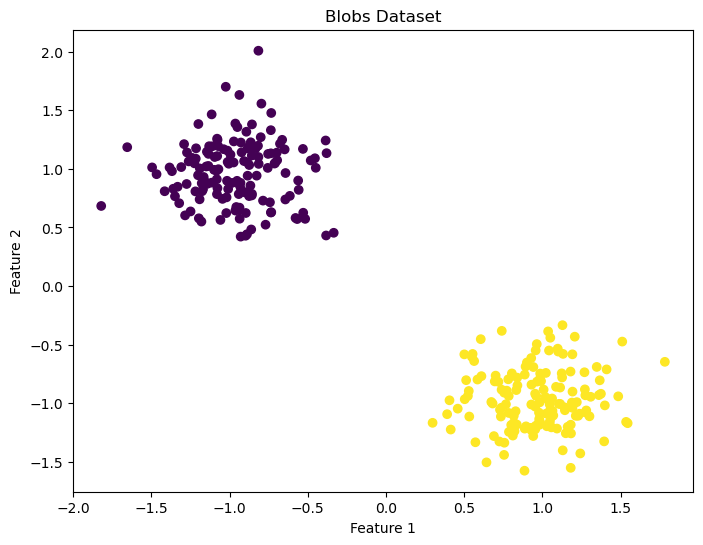

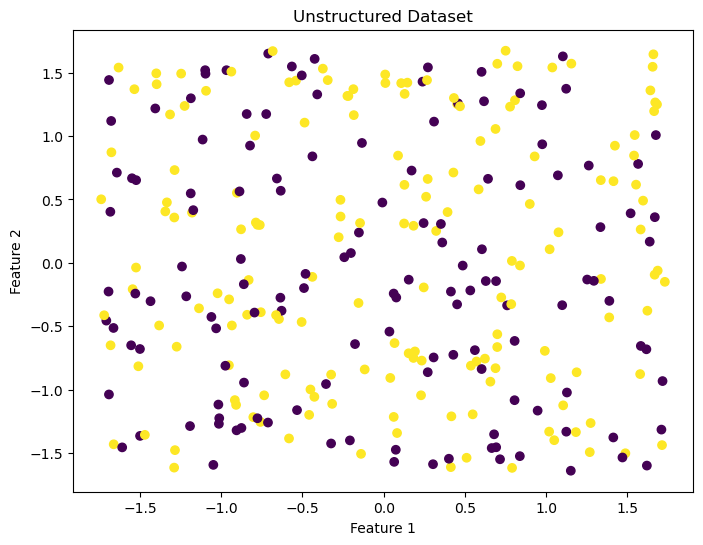

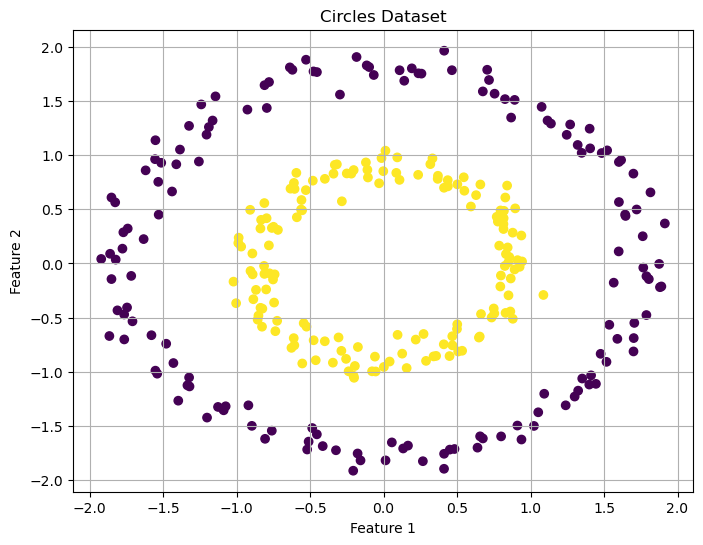

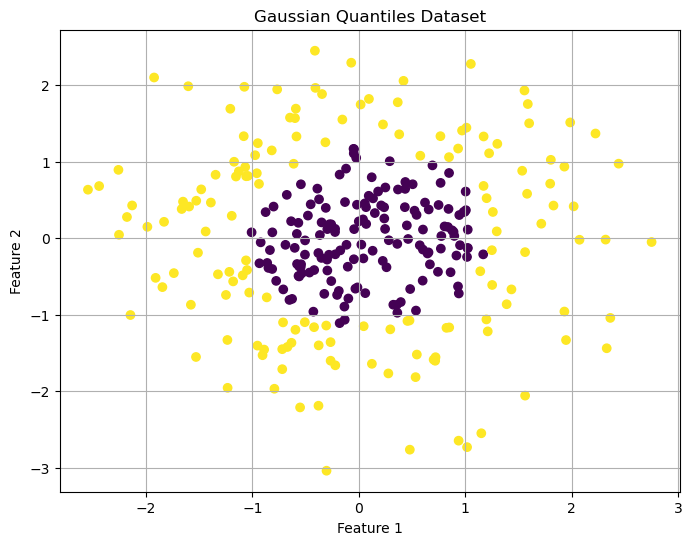

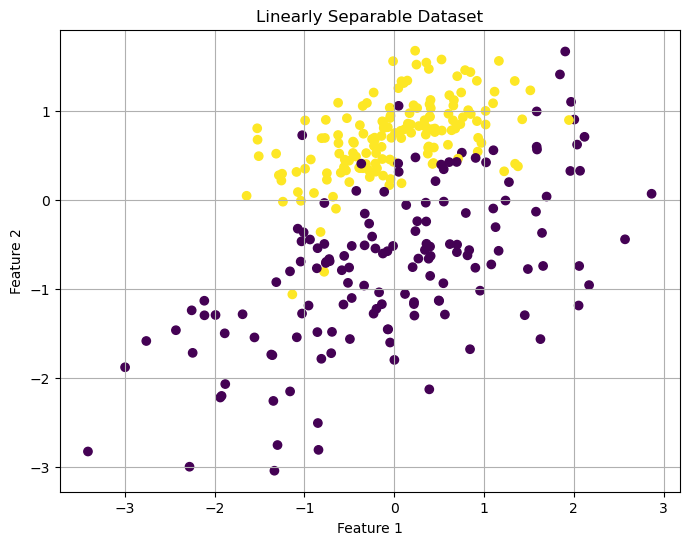

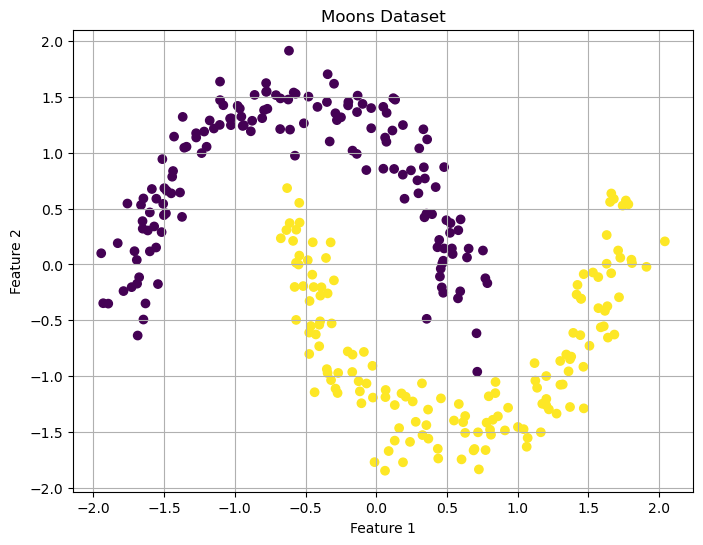

0
1


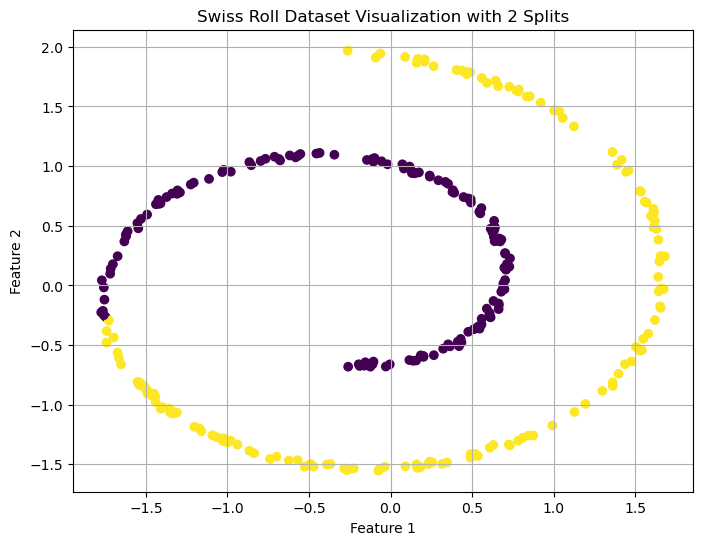

0
1


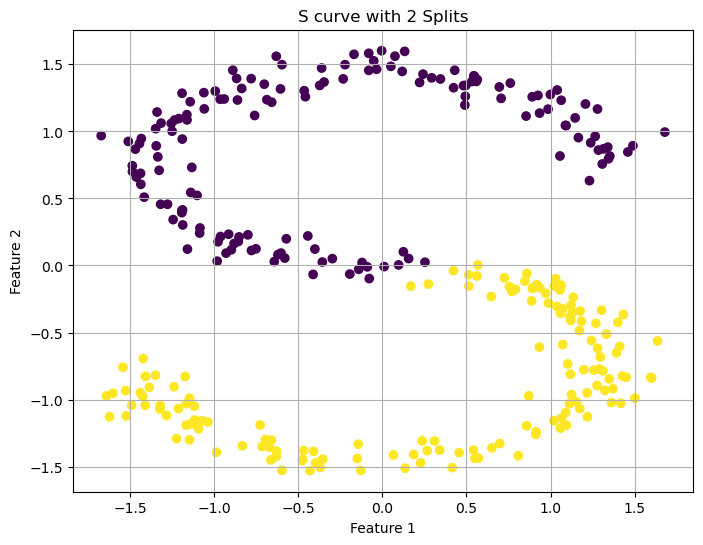

0
1
2
3
4
5
6
7
8
9


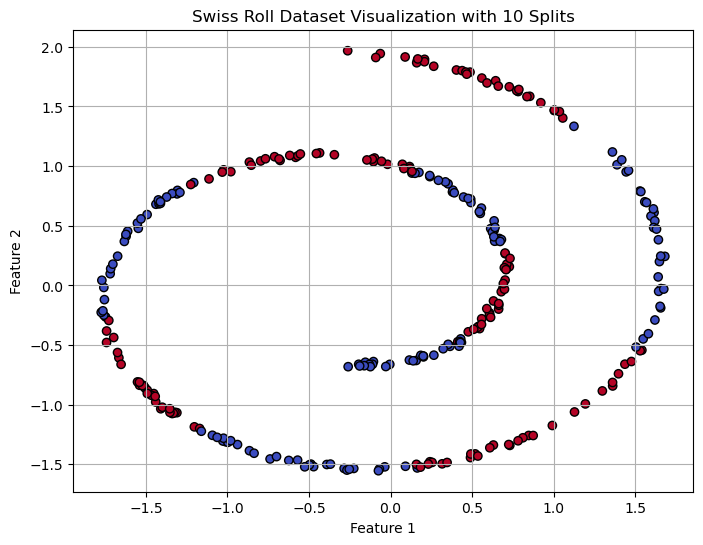

0
1
2
3
4
5
6
7
8
9


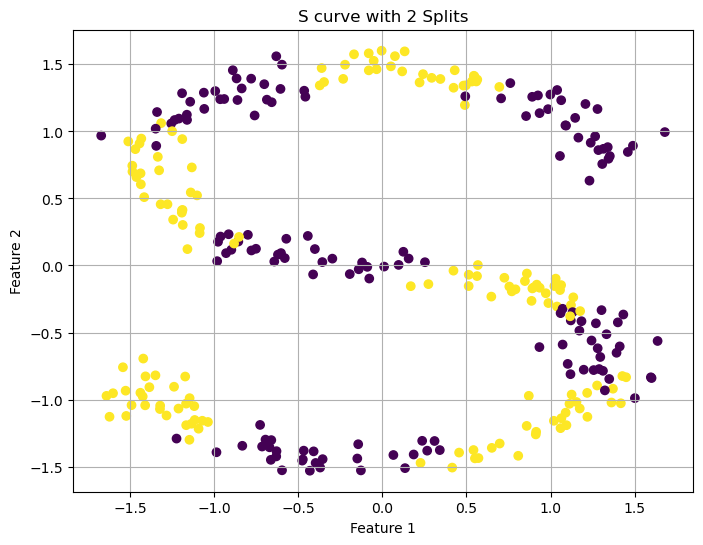

0
1
2
3
4
5
6
7
8
9


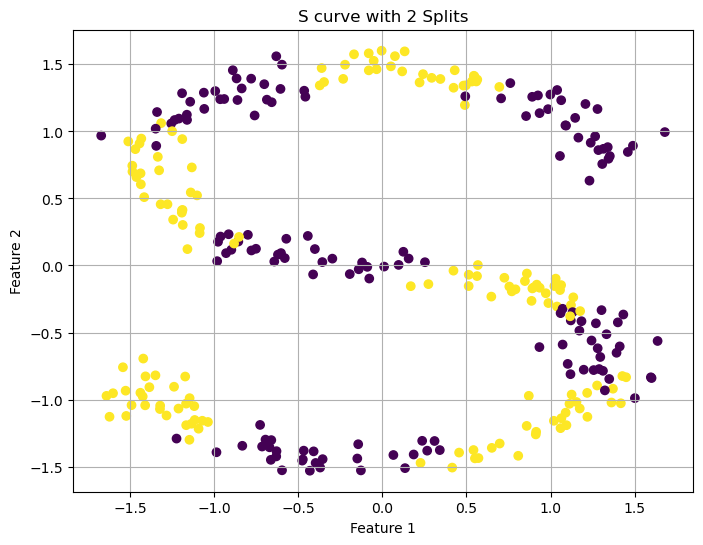

Dataset: linearly_separable


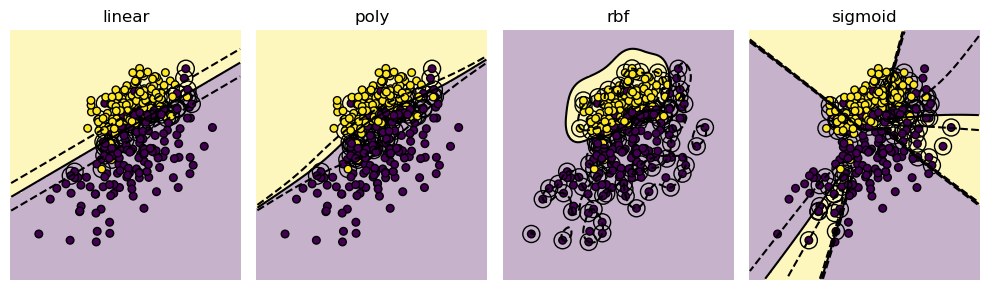

Dataset: blobs


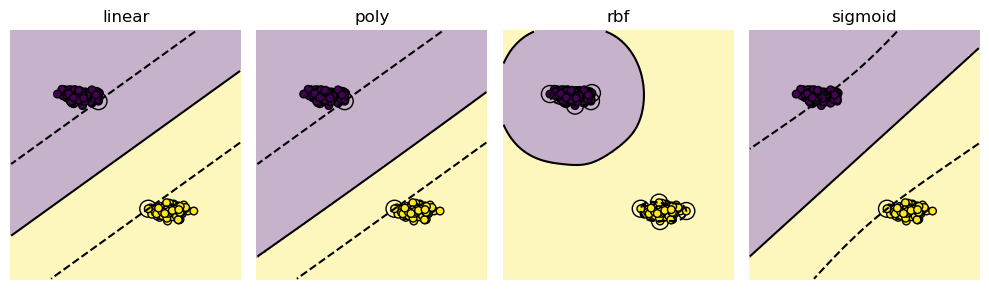

Dataset: quantiles


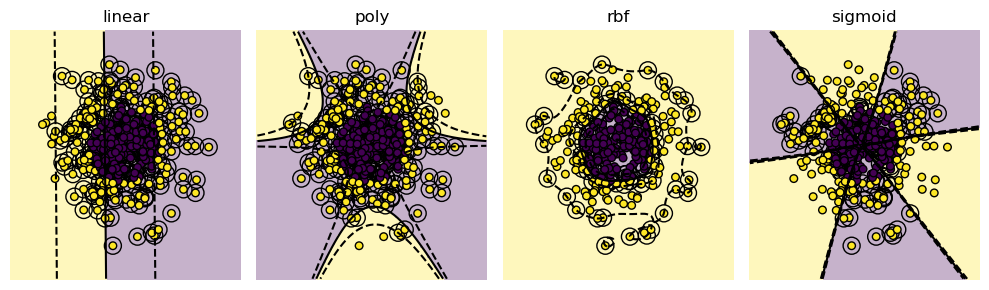

Dataset: moons


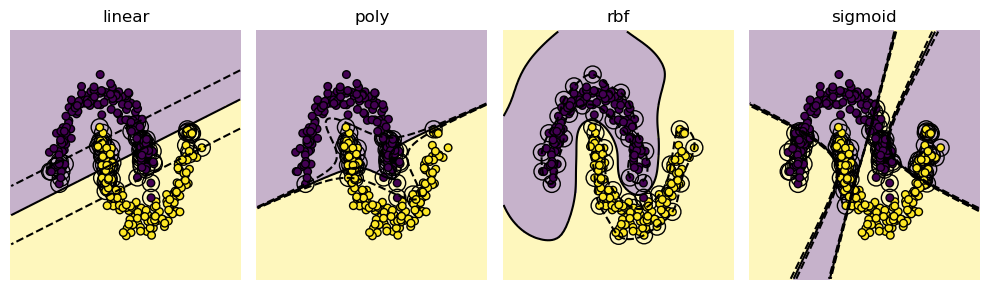

Dataset: circles


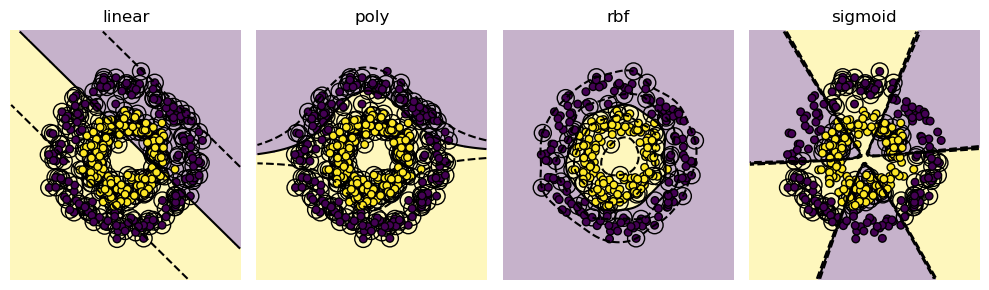

Dataset: unstructured


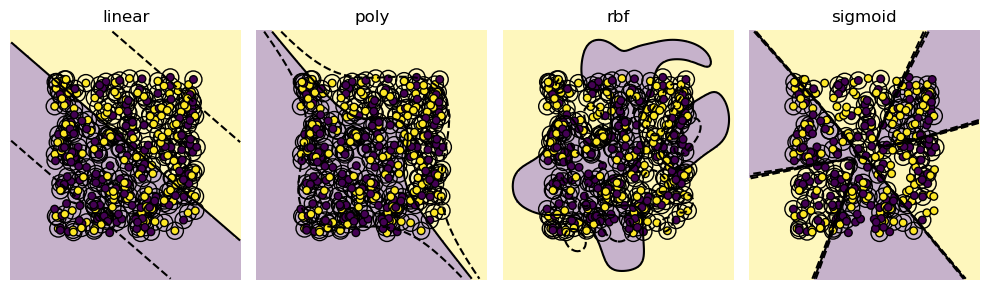

Dataset: swiss
0
1
2
3
4
5
6
7
8
9


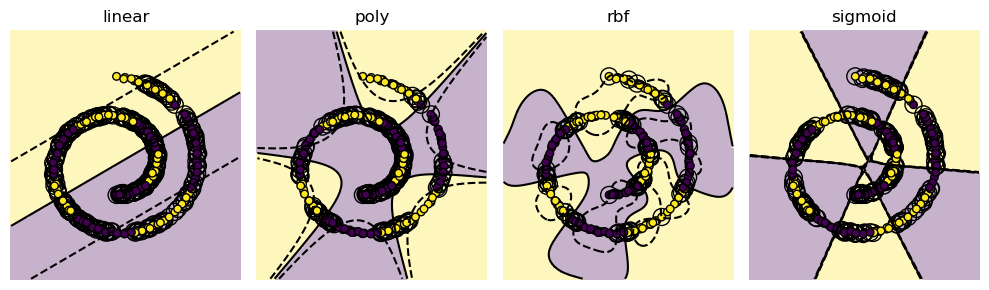

Dataset: scurve
0
1
2
3
4
5
6
7
8
9


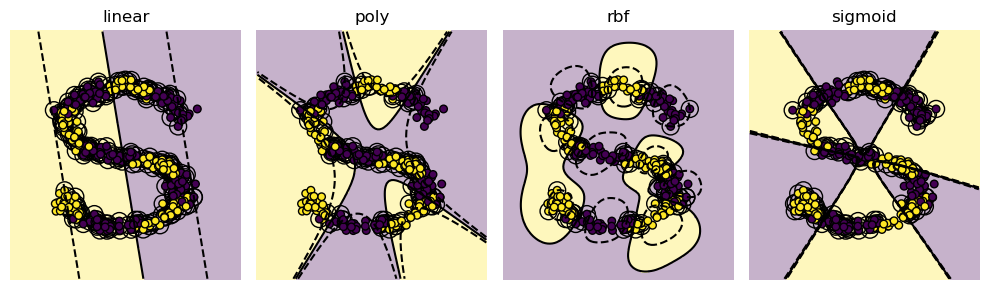

/opt/homebrew/Caskroom/miniforge/base/envs/mathai/lib/python3.11/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


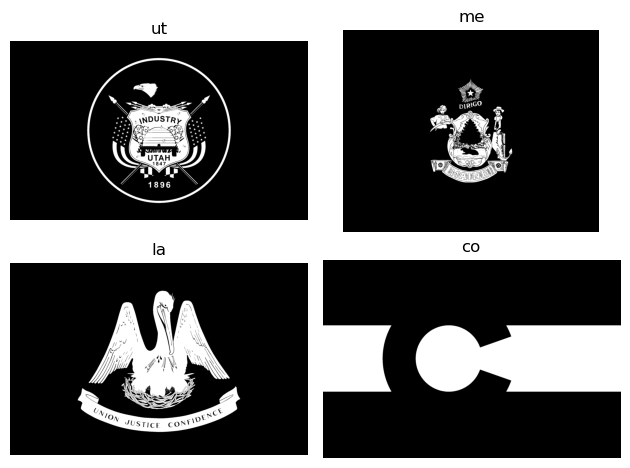

Kernel comparison for ut


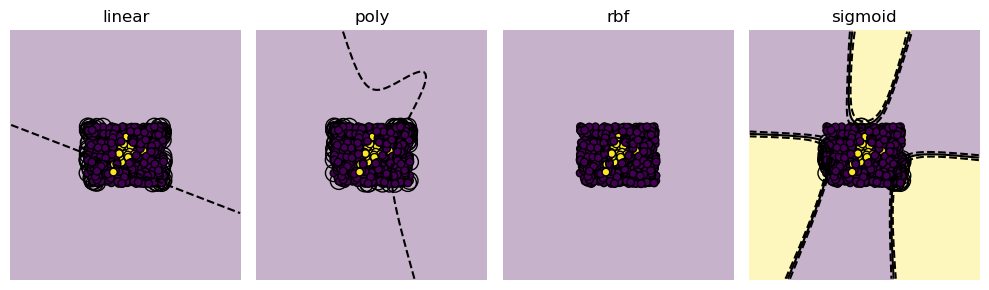

Kernel comparison for me


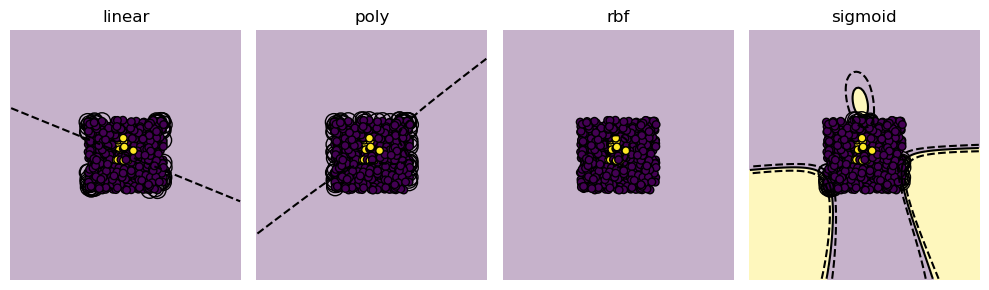

Kernel comparison for la


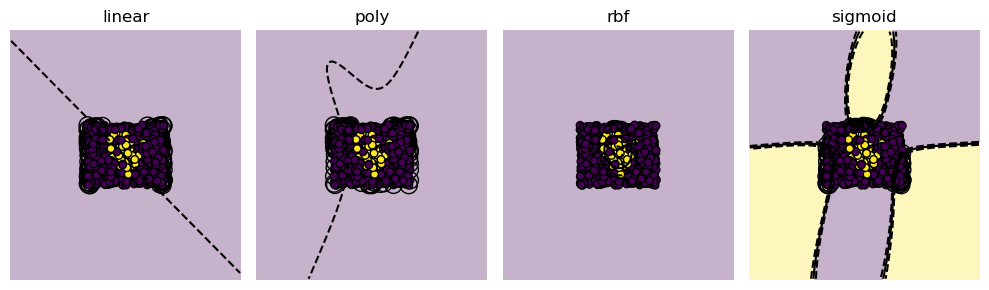

Kernel comparison for co


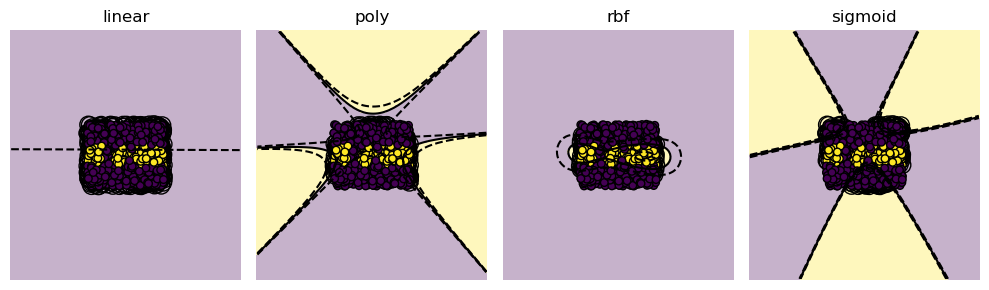

Kernel comparison for nh


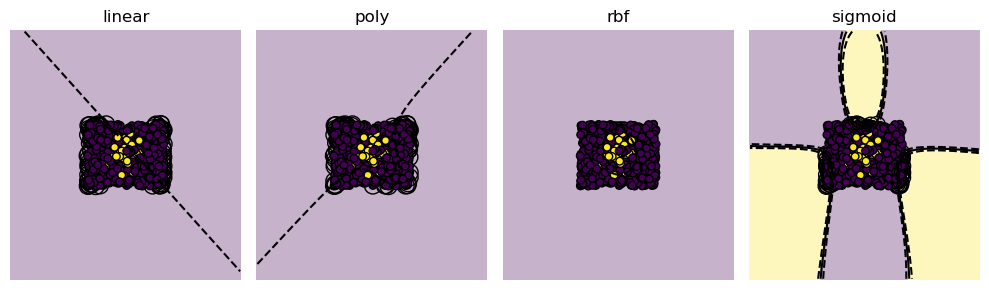

Kernel comparison for ms


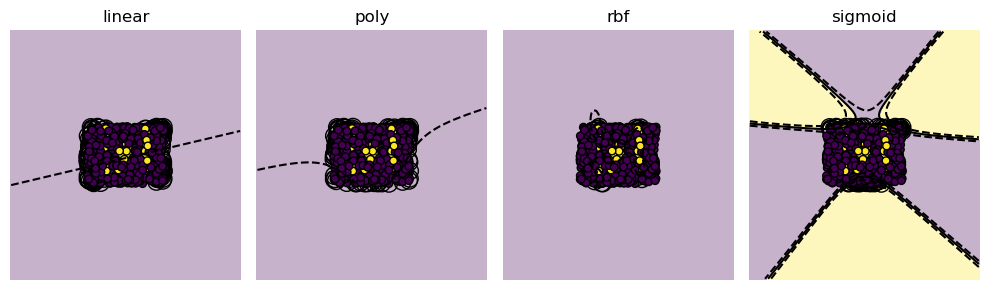

Kernel comparison for md


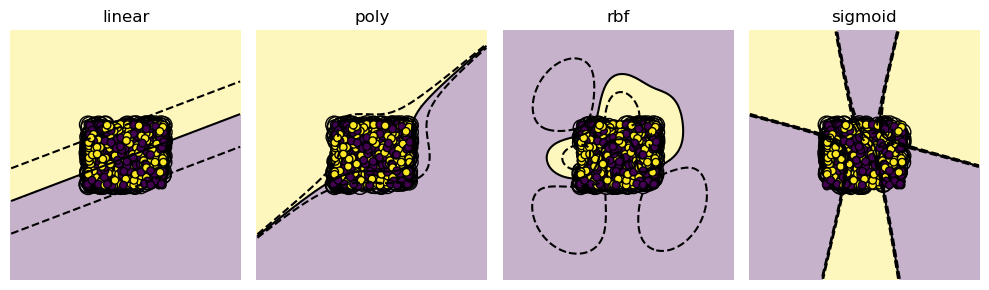

Kernel comparison for nj


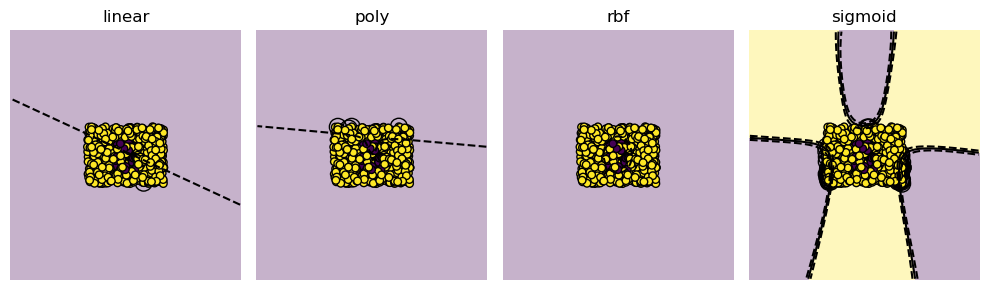

Kernel comparison for ar


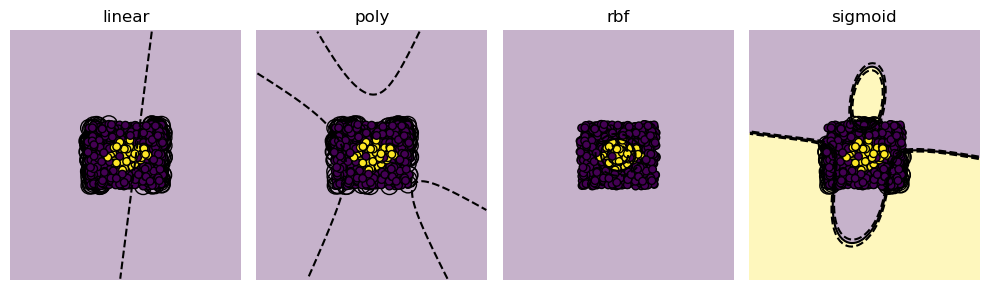

Kernel comparison for wi


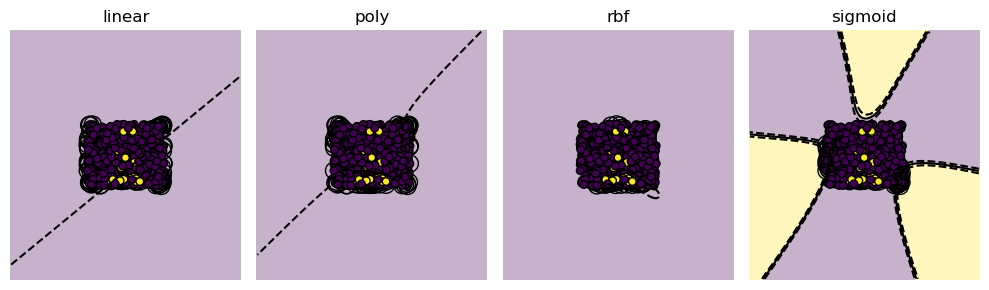

Kernel comparison for ok


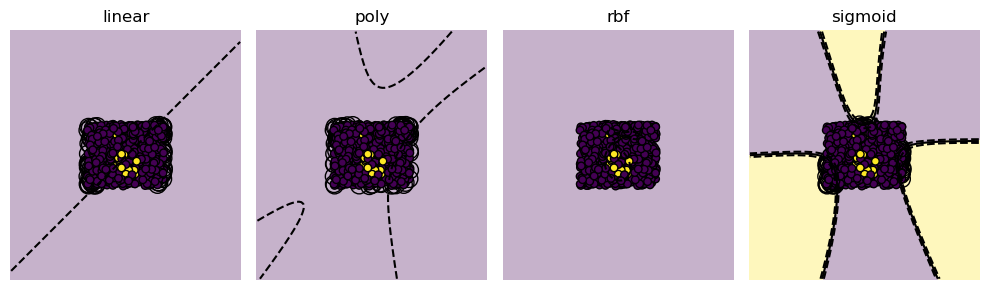

Kernel comparison for mt


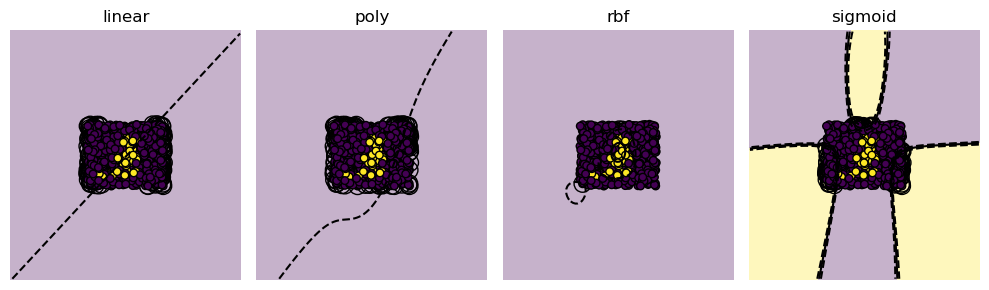

Kernel comparison for ny


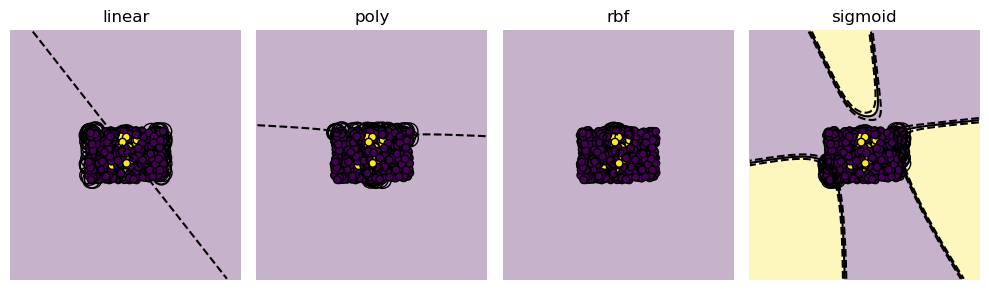

Kernel comparison for wy


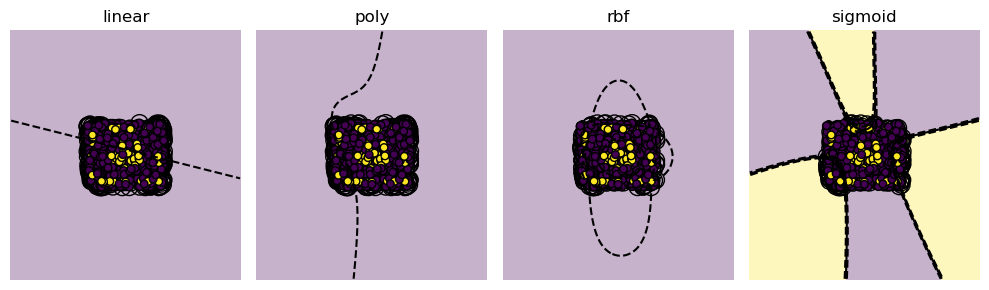

Kernel comparison for oh


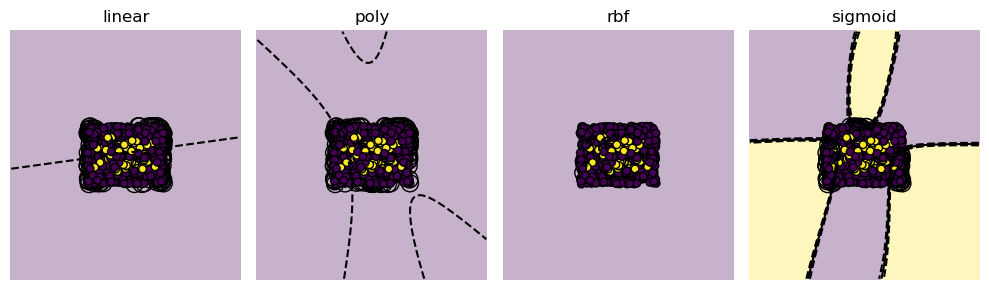

Kernel comparison for ma


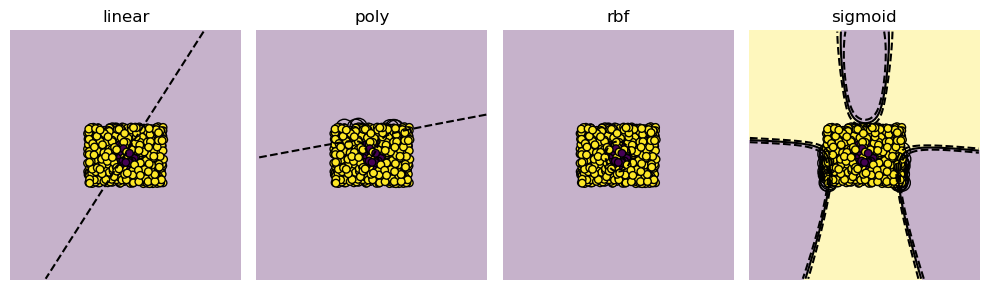

Kernel comparison for nm


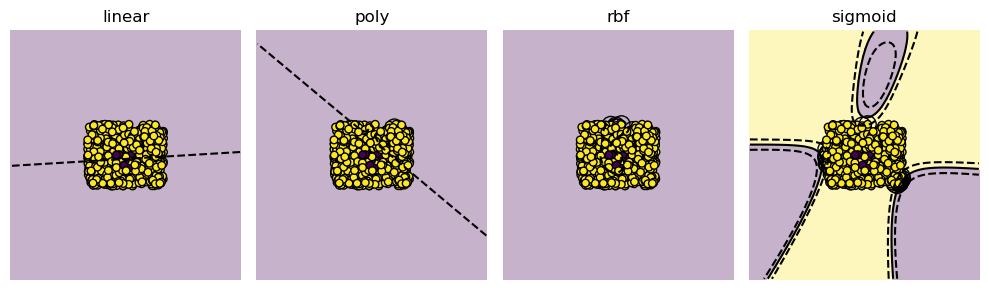

Kernel comparison for in


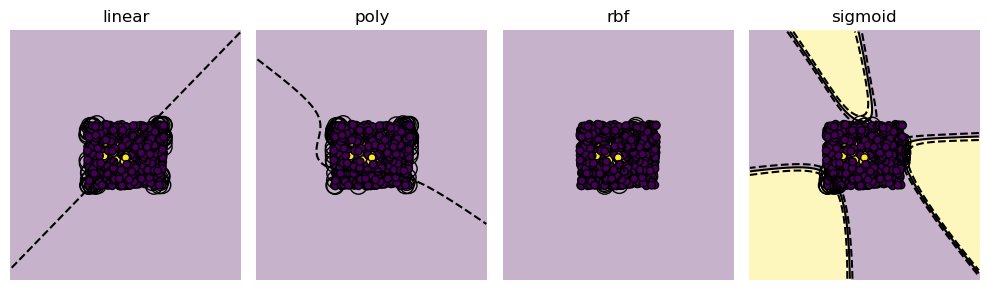

Kernel comparison for sc


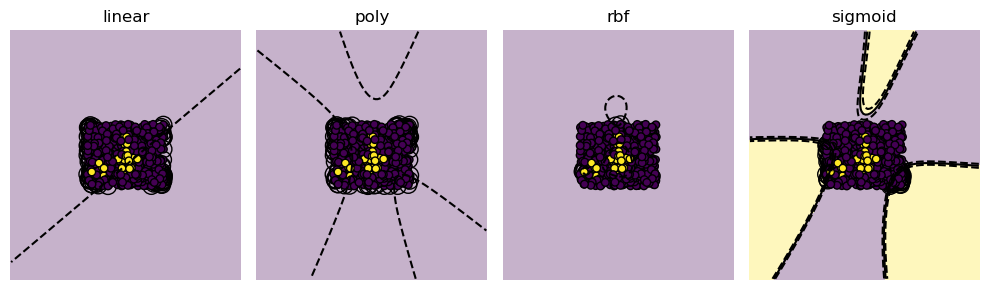

Kernel comparison for hi


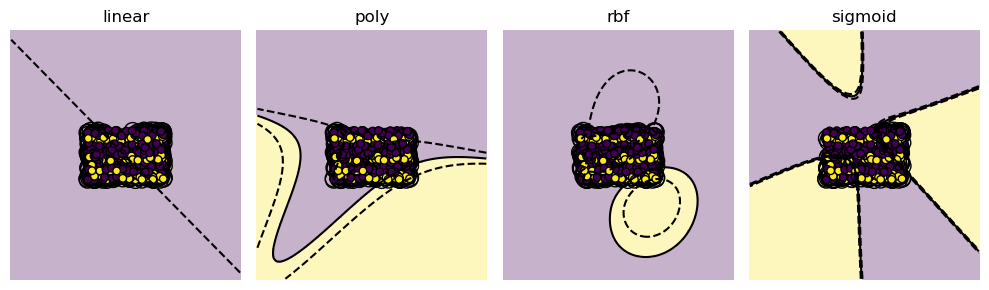

Kernel comparison for ks


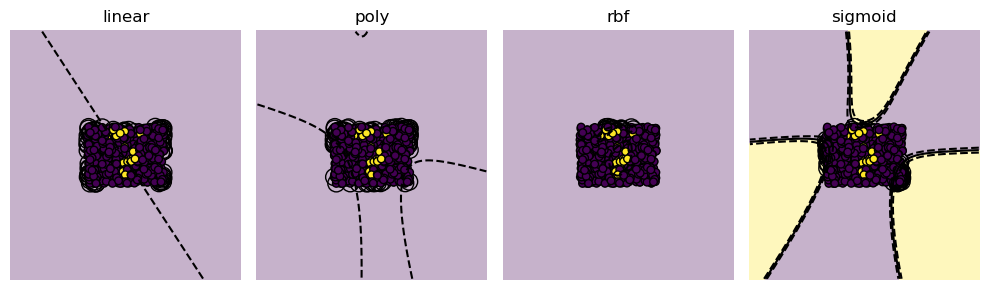

Kernel comparison for il


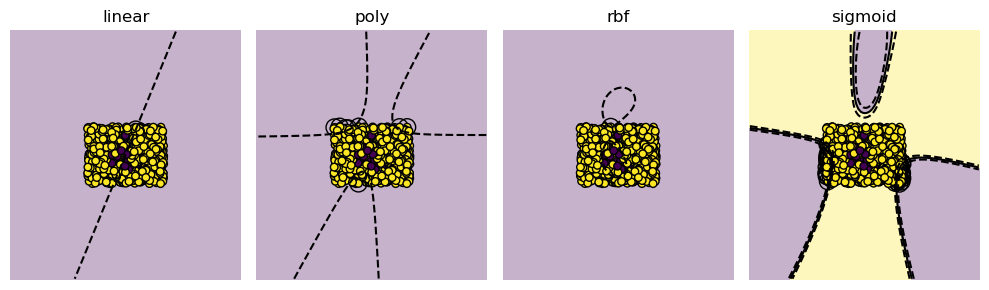

Kernel comparison for ga


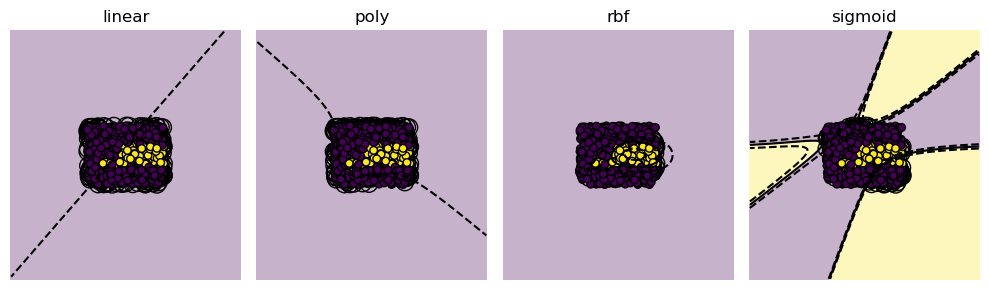

Kernel comparison for sd


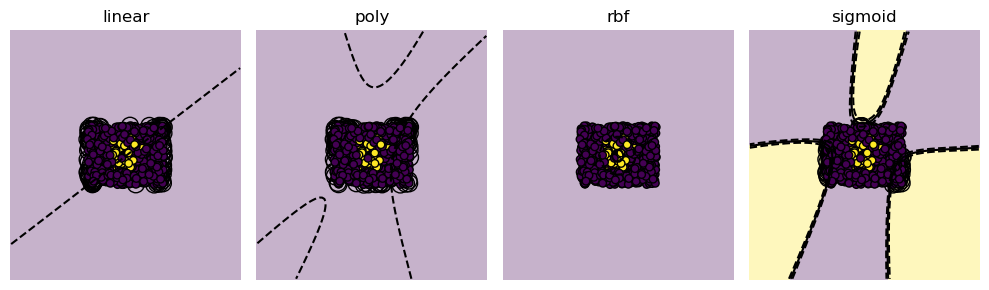

Kernel comparison for ky


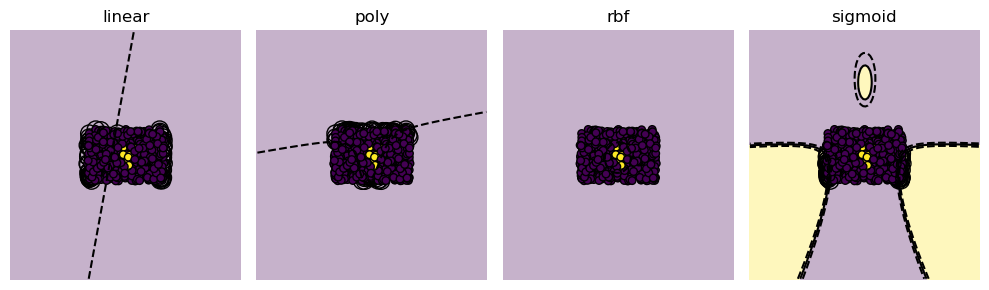

Kernel comparison for id


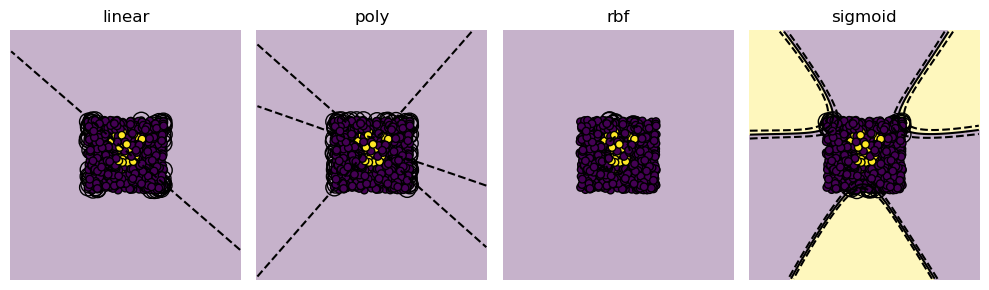

Kernel comparison for ia


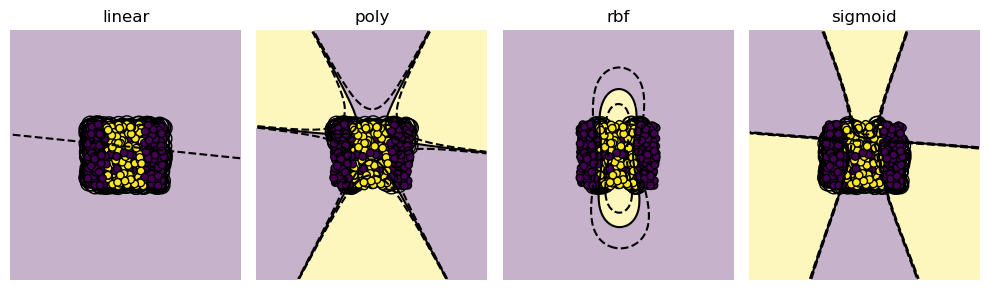

Kernel comparison for de


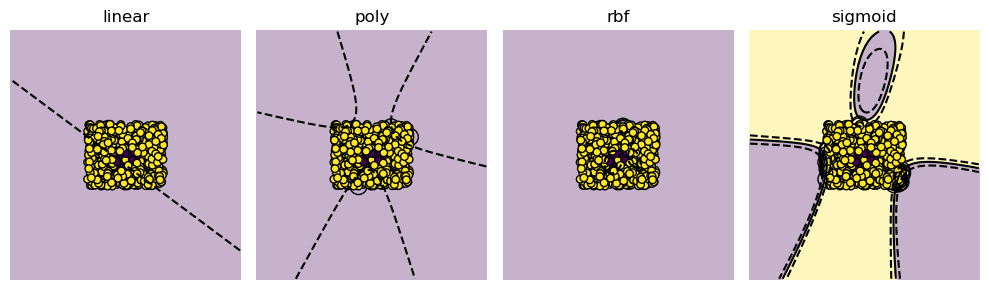

Kernel comparison for fl


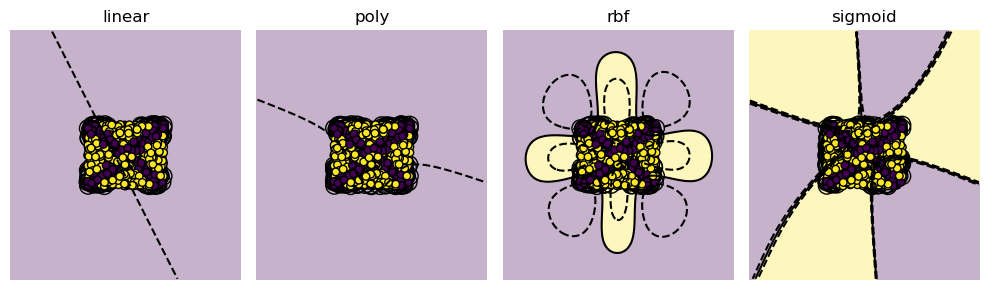

Kernel comparison for pa


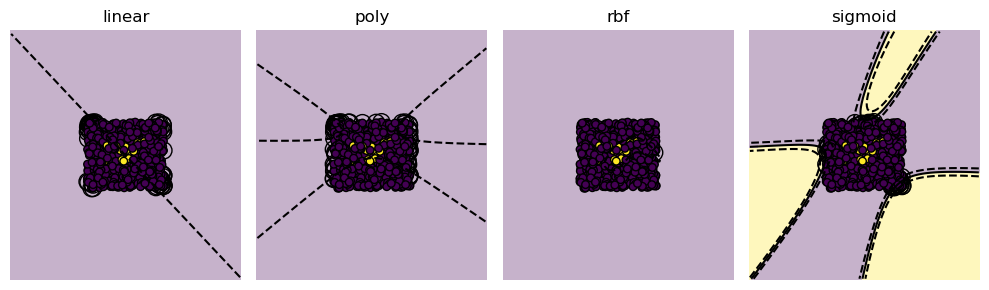

Kernel comparison for ri


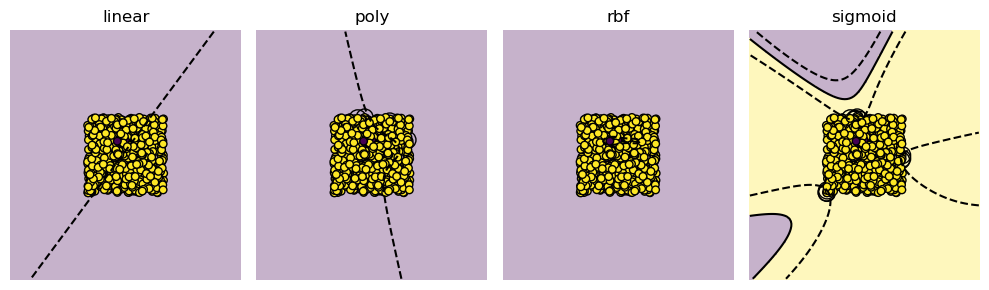

Kernel comparison for tn


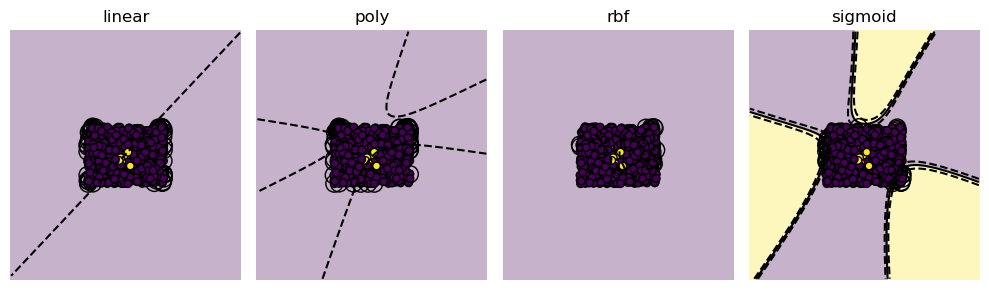

Kernel comparison for nv


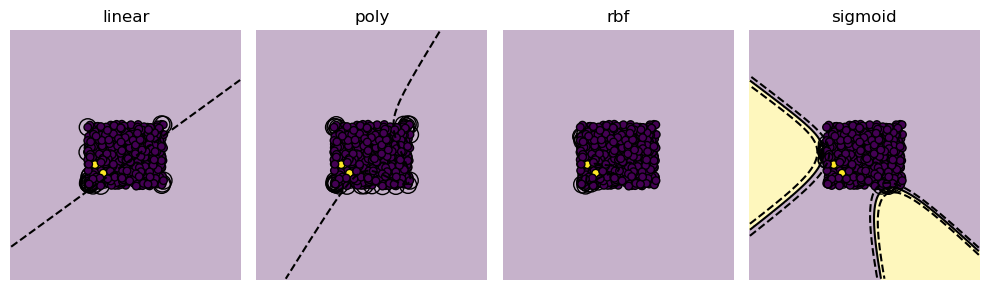

Kernel comparison for or


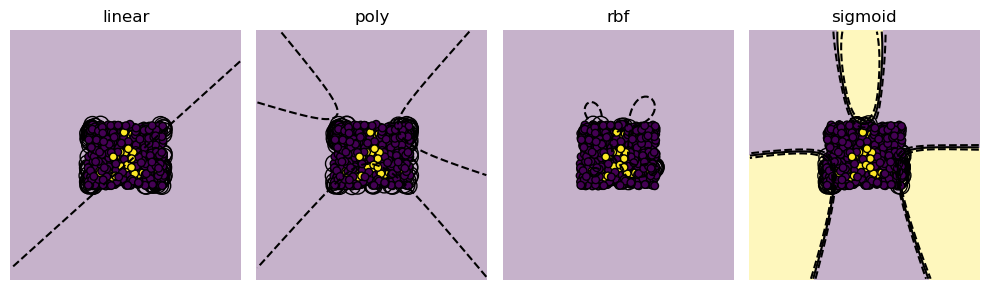

Kernel comparison for tx


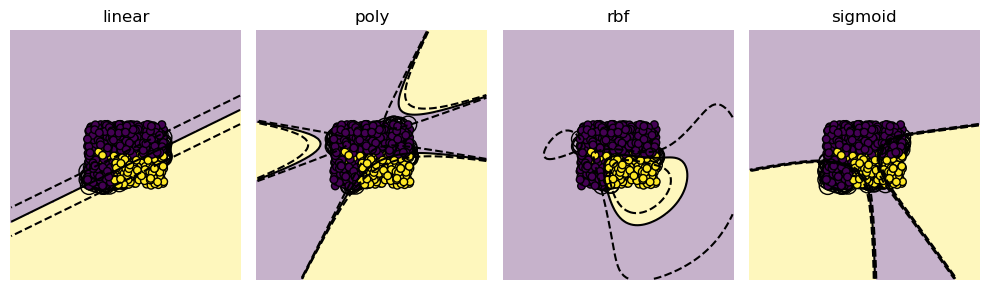

Kernel comparison for wa


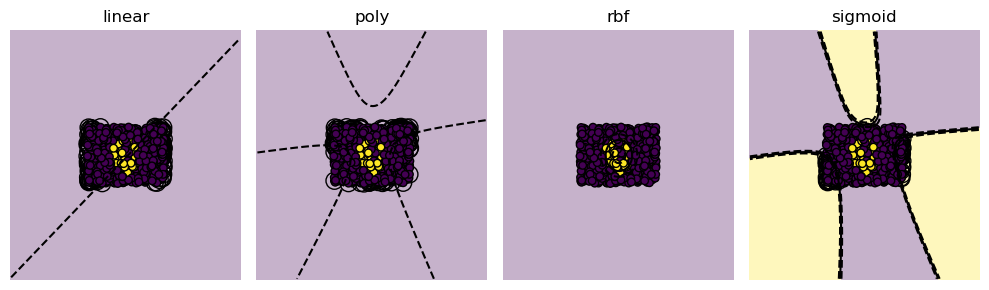

Kernel comparison for wv


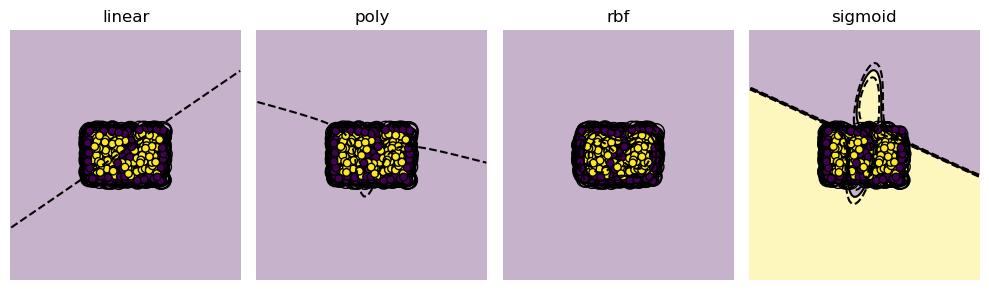

Kernel comparison for nc


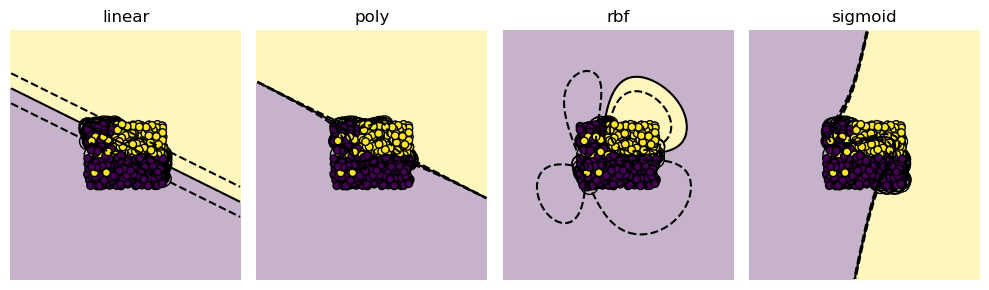

Kernel comparison for mo


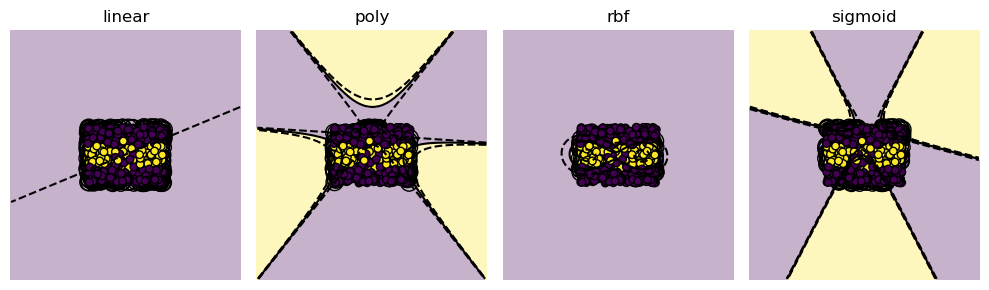

Kernel comparison for al


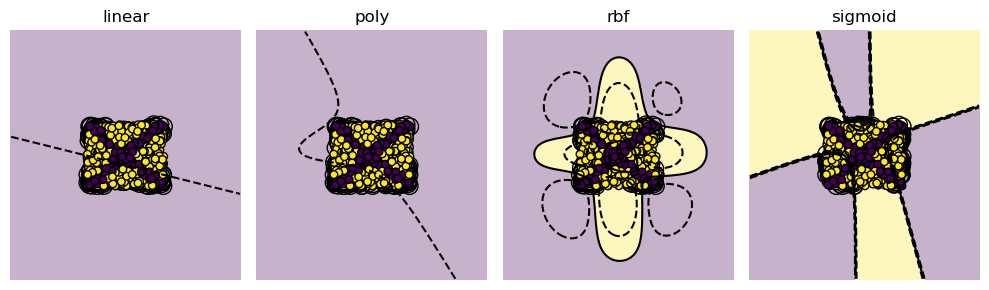

Kernel comparison for az


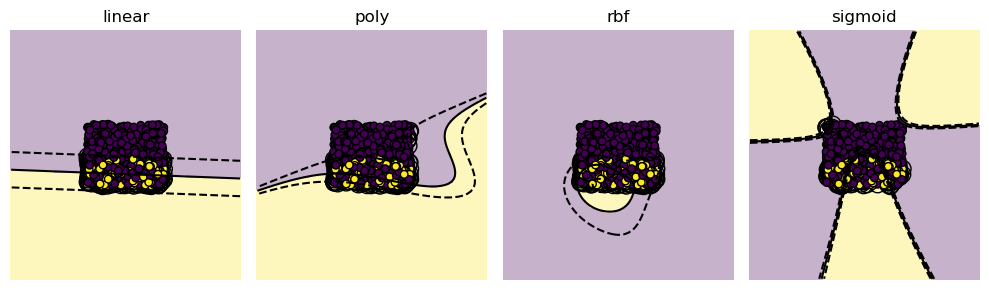

Kernel comparison for mn


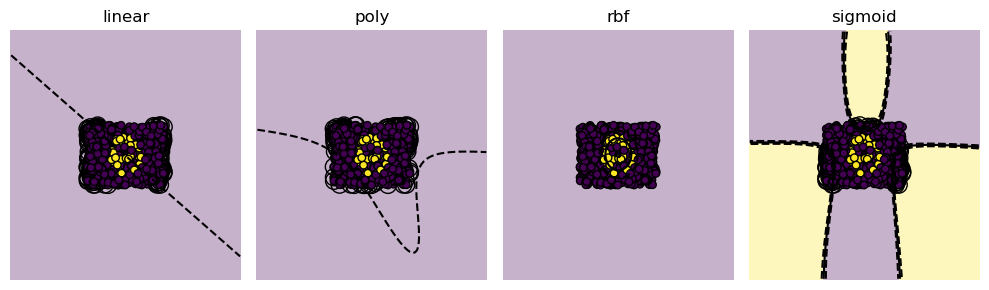

Kernel comparison for ca


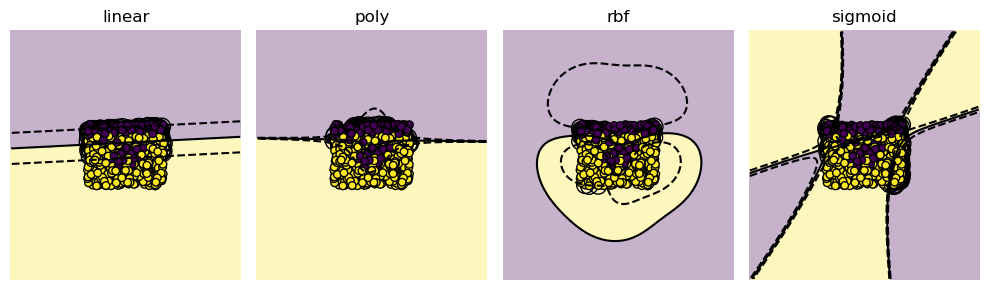

Kernel comparison for va


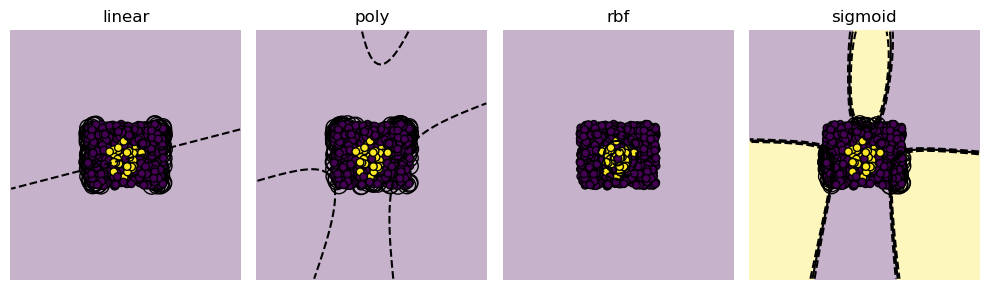

Kernel comparison for vt


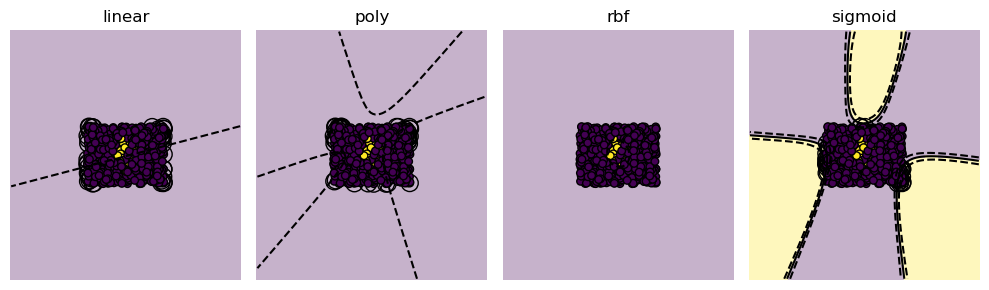

Kernel comparison for mi


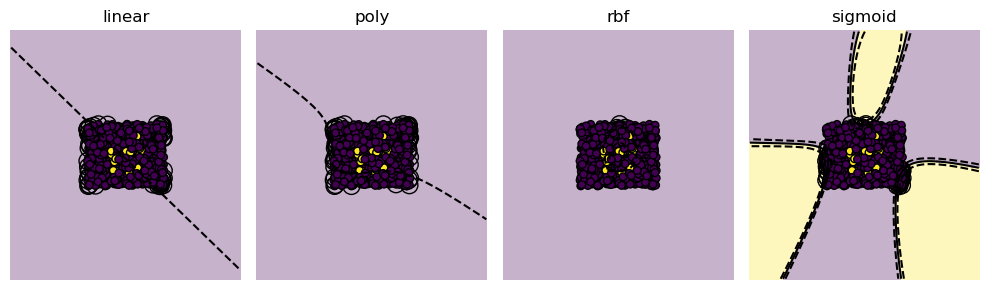

Kernel comparison for ne


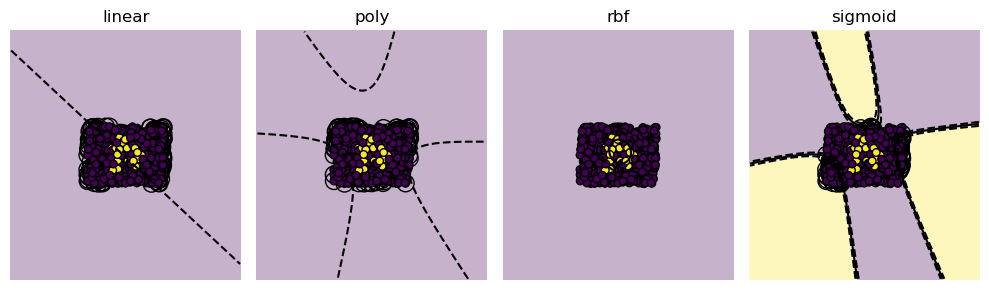

Kernel comparison for ak


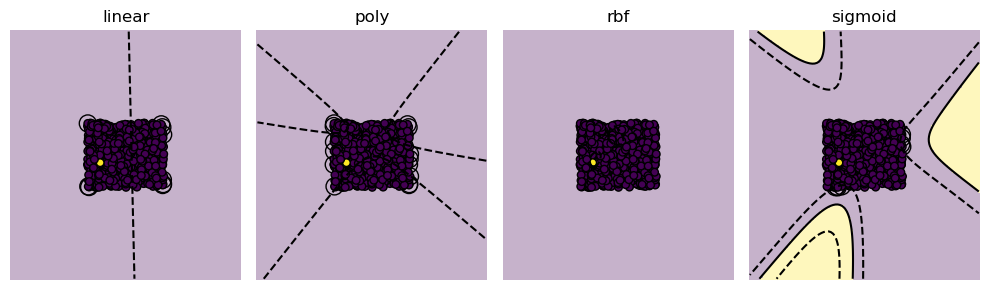

Kernel comparison for ct


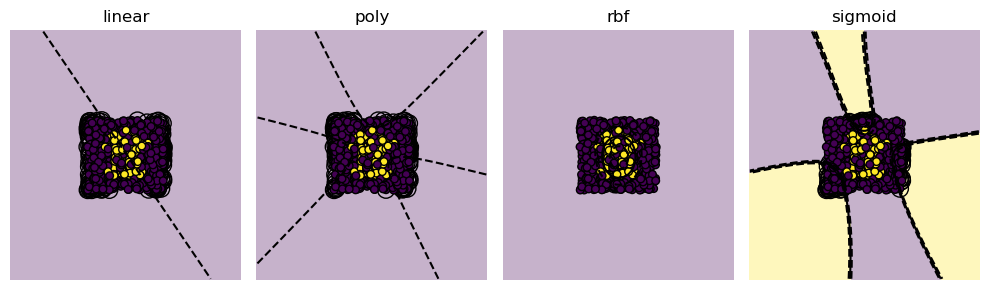

Kernel comparison for nd


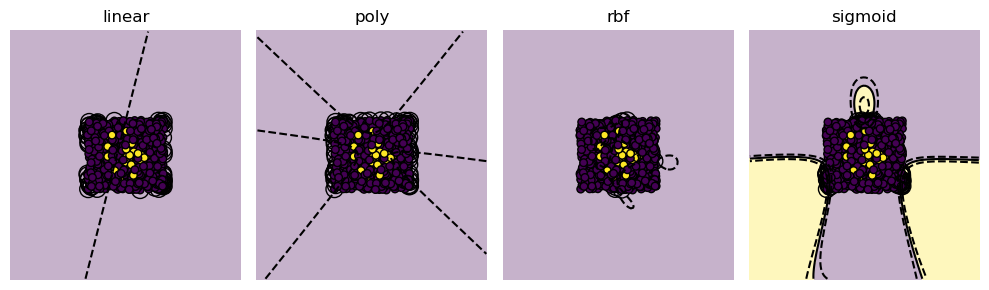

/opt/homebrew/Caskroom/miniforge/base/envs/mathai/lib/python3.11/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Kernel comparison for ut


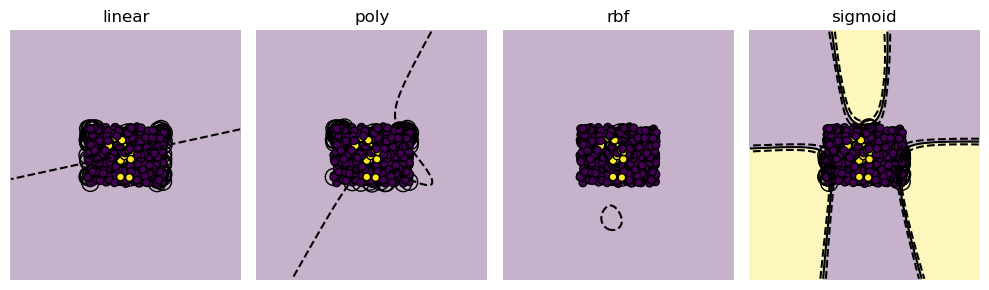

Kernel comparison for me


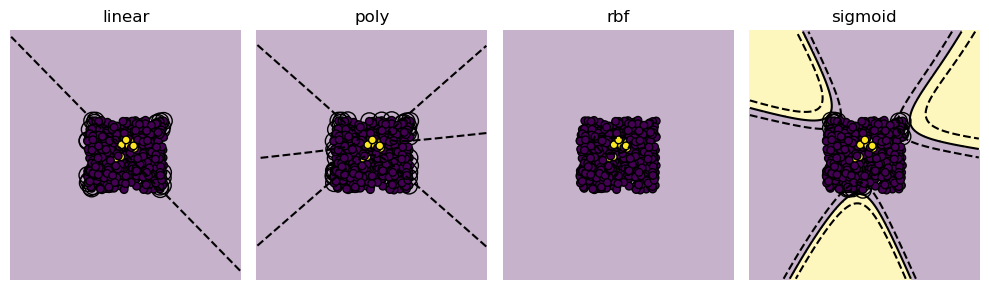

Kernel comparison for la


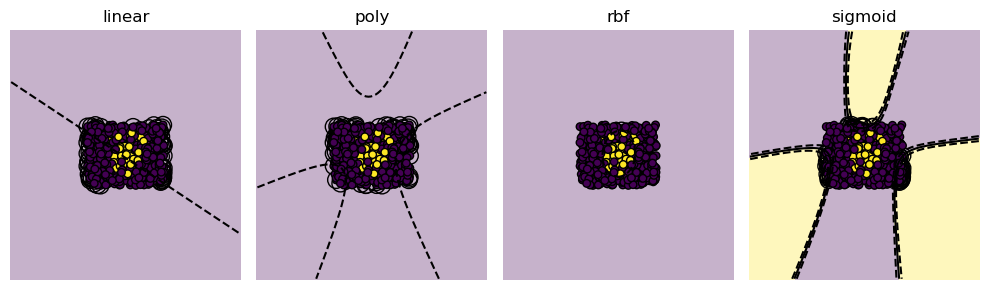

Kernel comparison for co


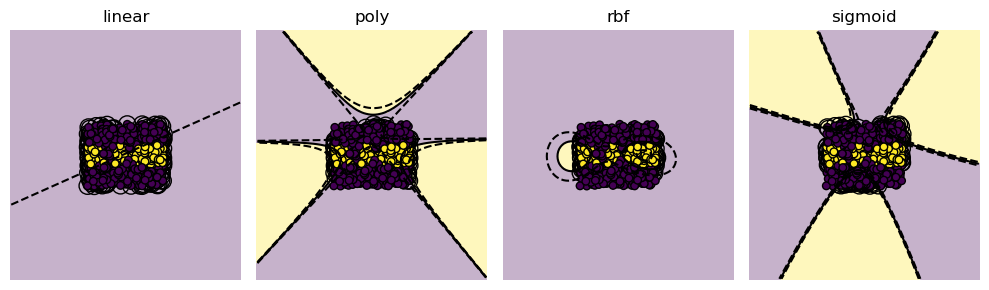

Kernel comparison for nh


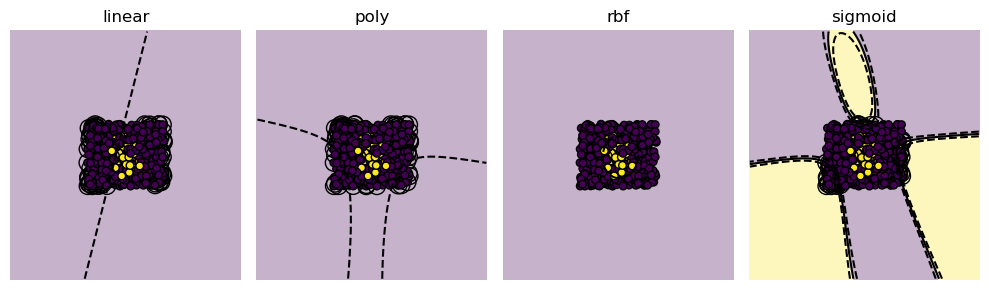

Kernel comparison for ms


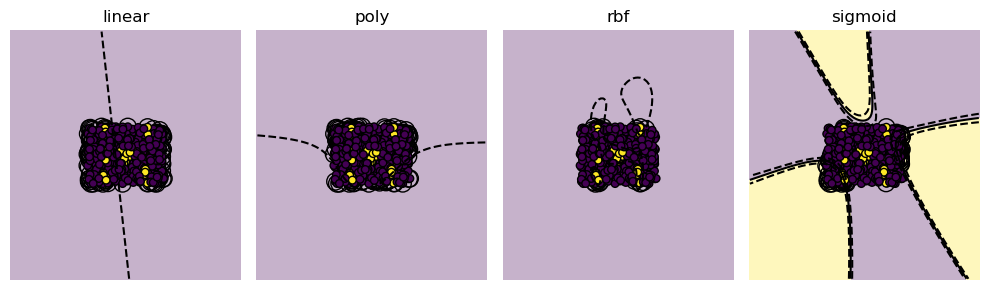

Kernel comparison for md


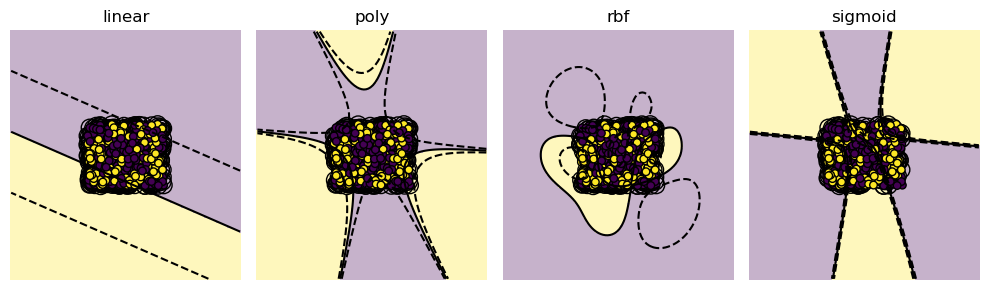

Kernel comparison for nj


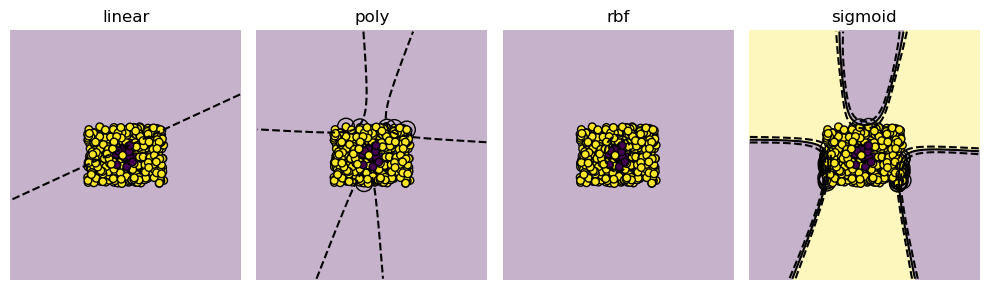

Kernel comparison for ar


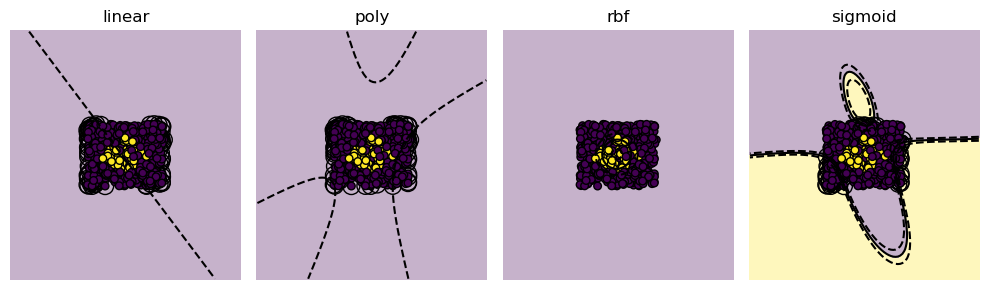

Kernel comparison for wi


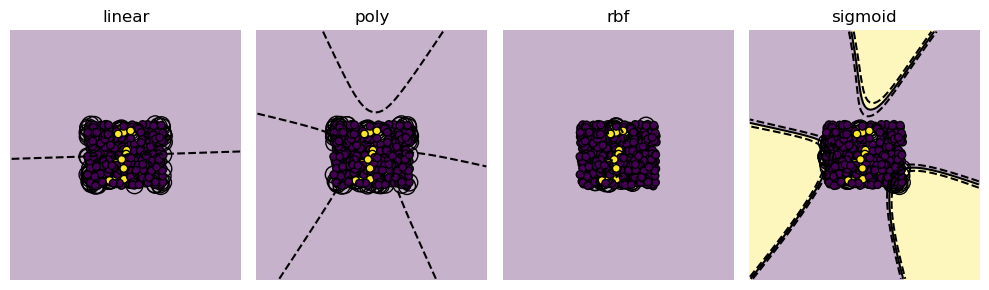

Kernel comparison for ok


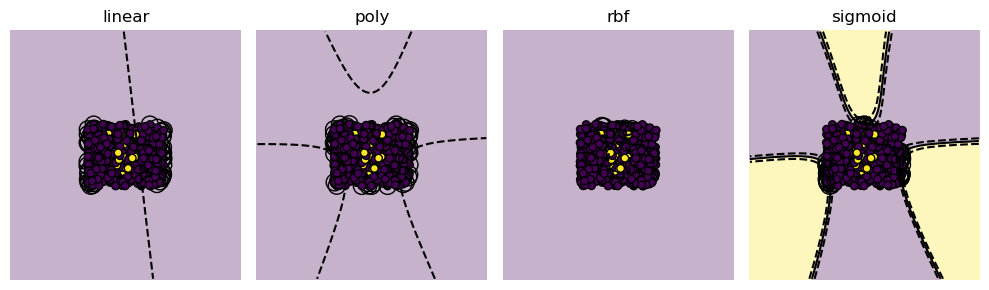

Kernel comparison for mt


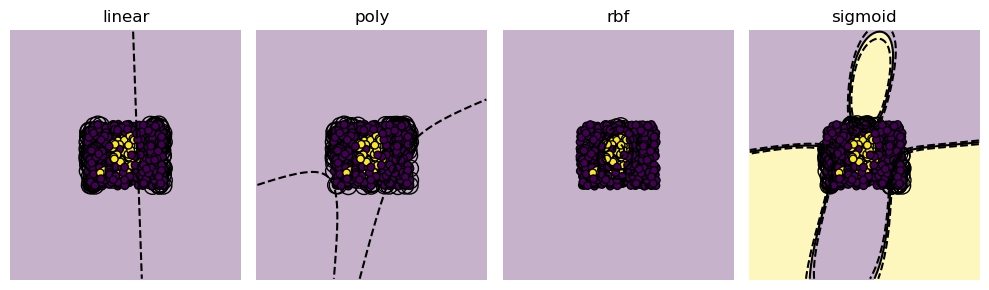

Kernel comparison for ny


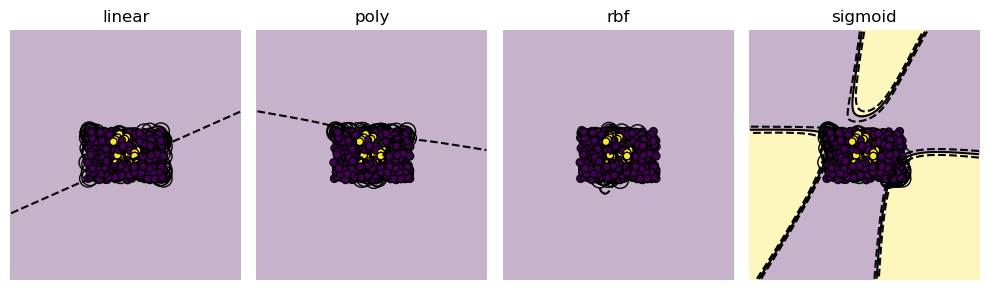

Kernel comparison for wy


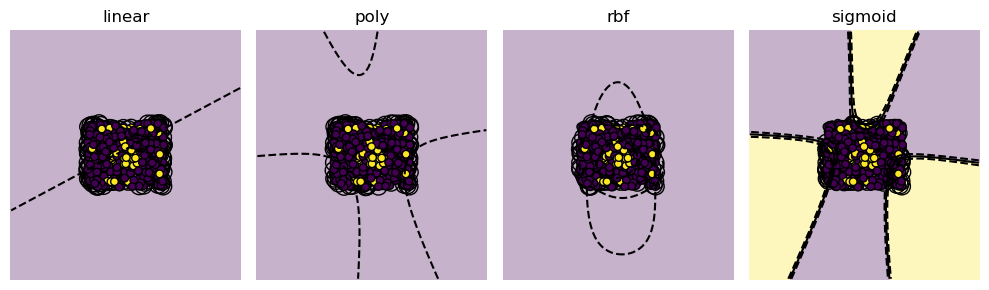

Kernel comparison for oh


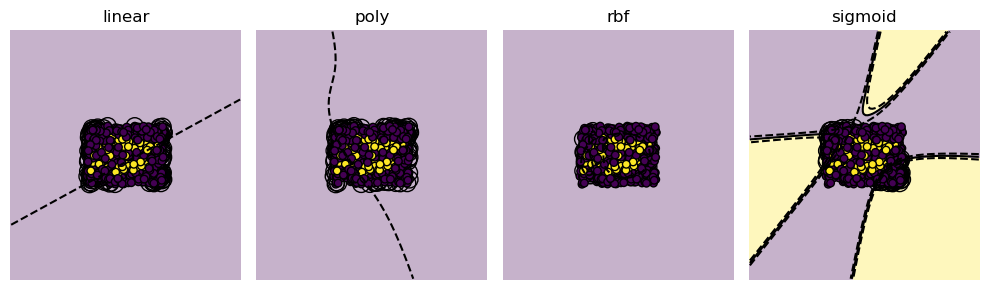

Kernel comparison for ma


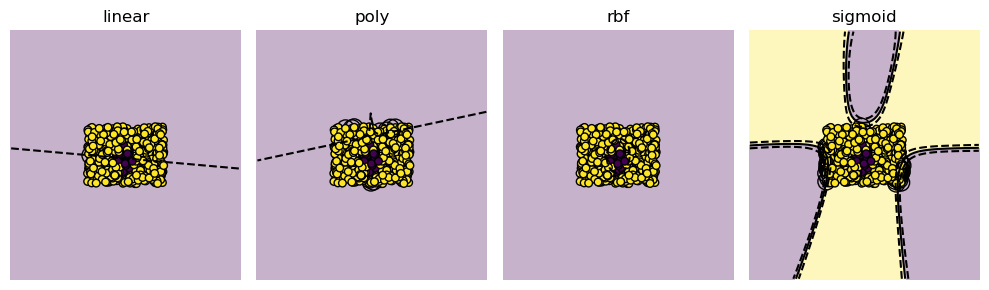

Kernel comparison for nm


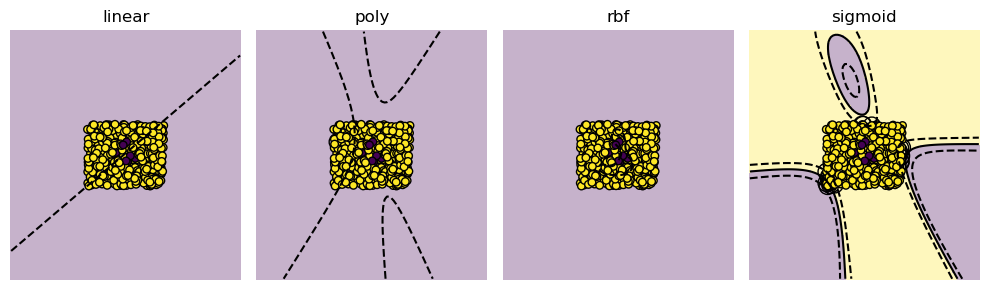

Kernel comparison for in


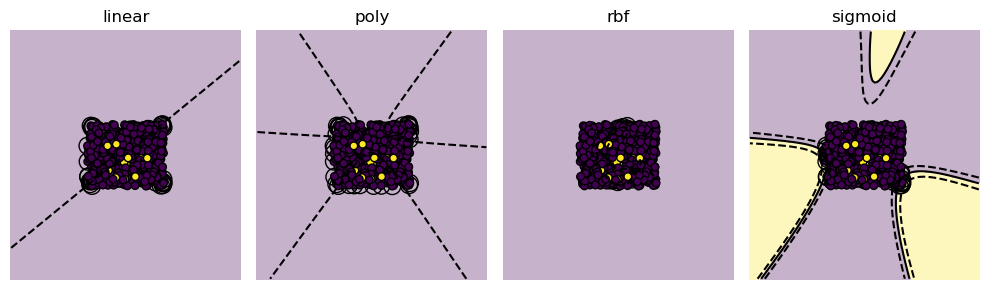

Kernel comparison for sc


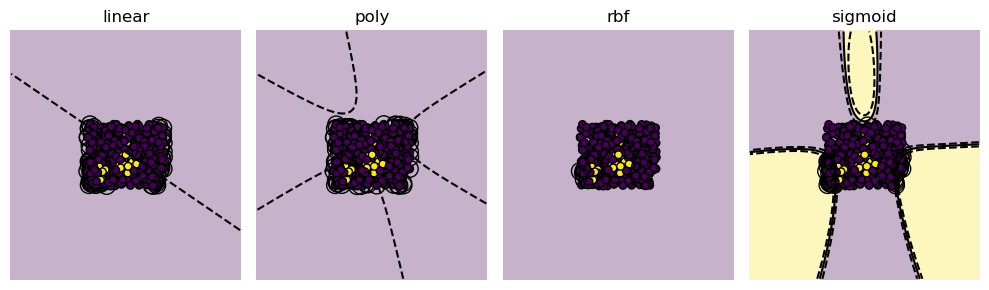

Kernel comparison for hi


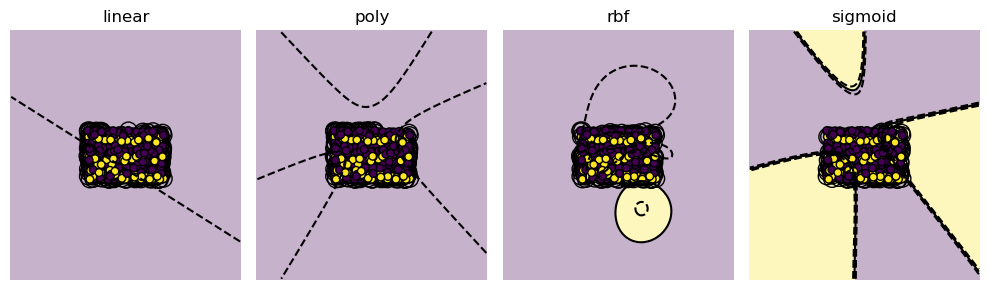

Kernel comparison for ks


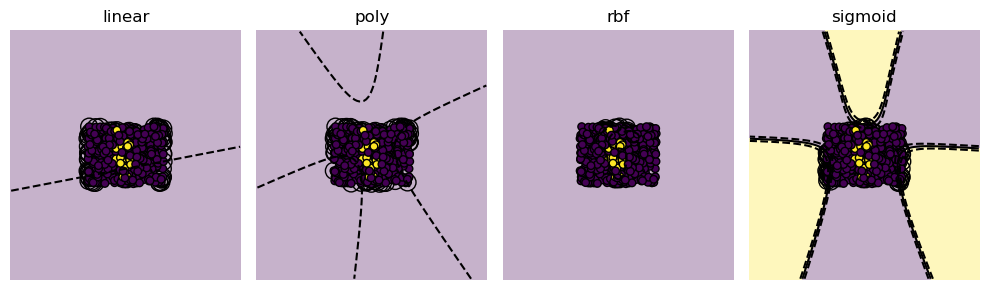

Kernel comparison for il


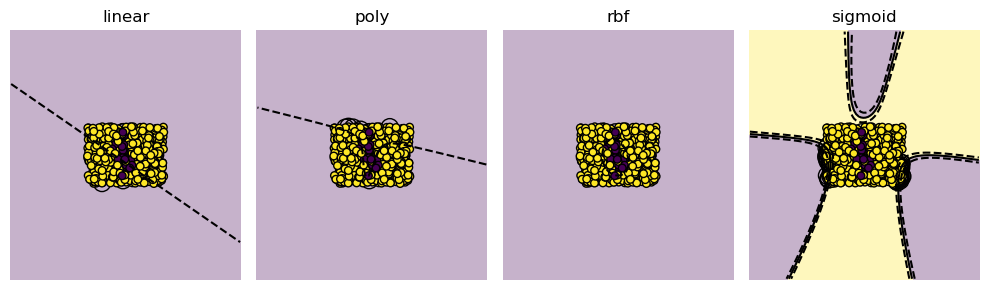

Kernel comparison for ga


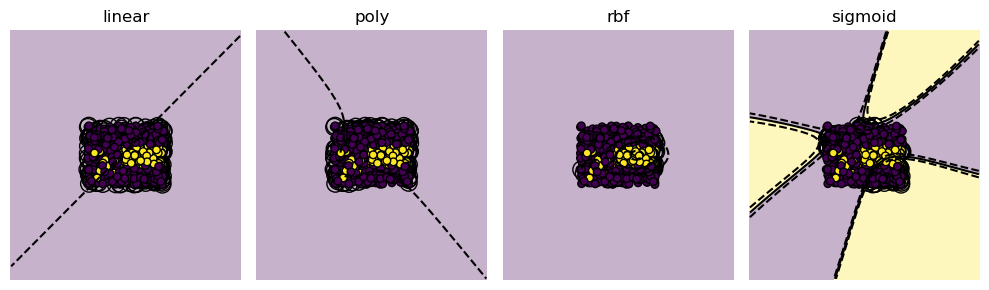

Kernel comparison for sd


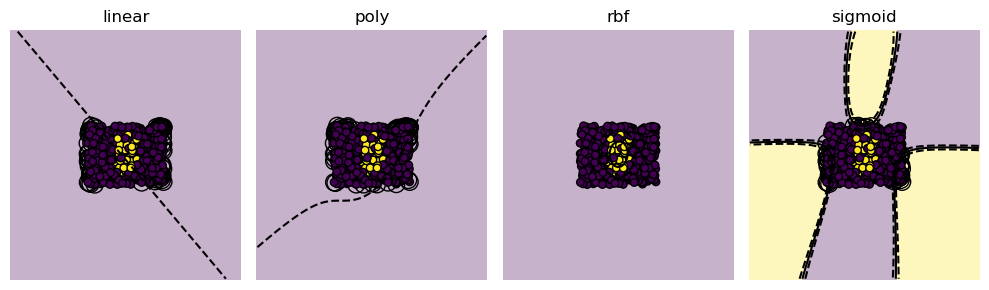

Kernel comparison for ky


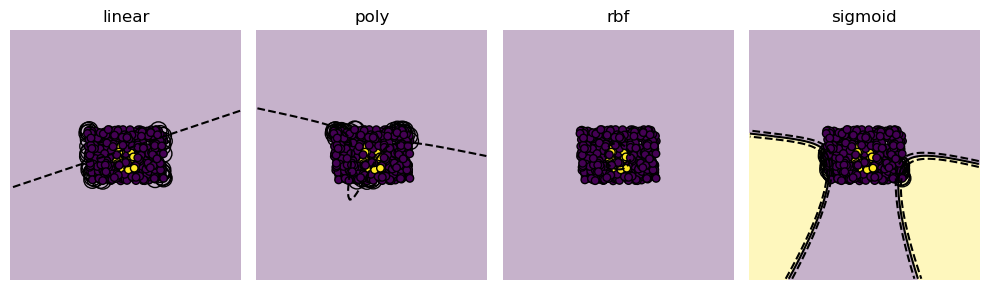

Kernel comparison for id


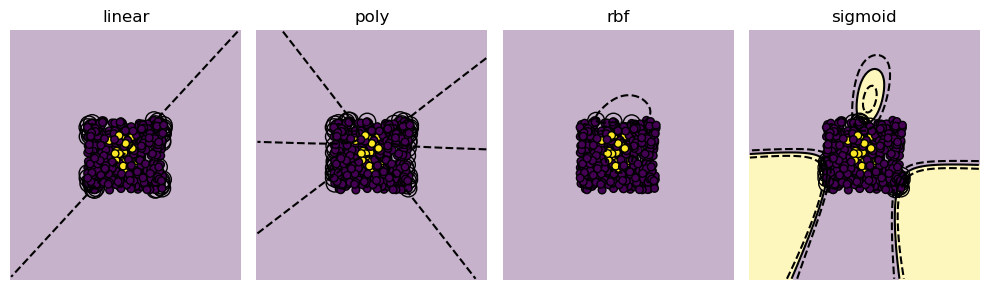

Kernel comparison for ia


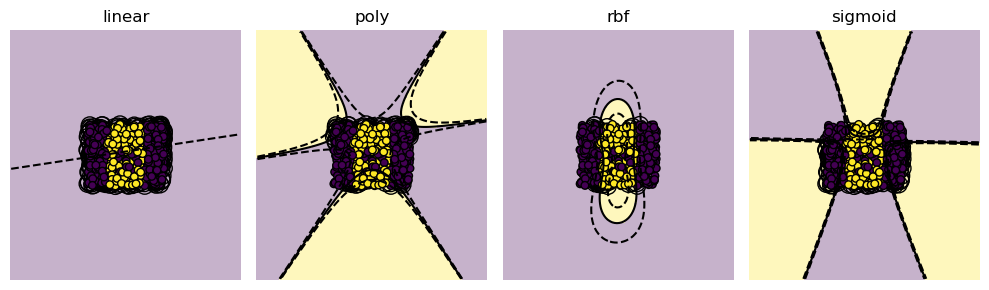

Kernel comparison for de


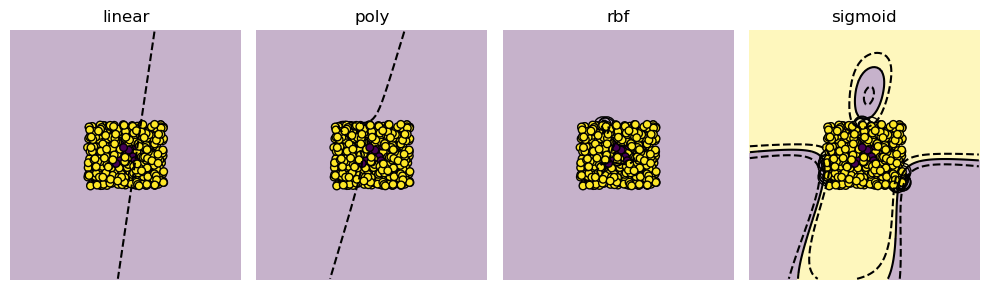

Kernel comparison for fl


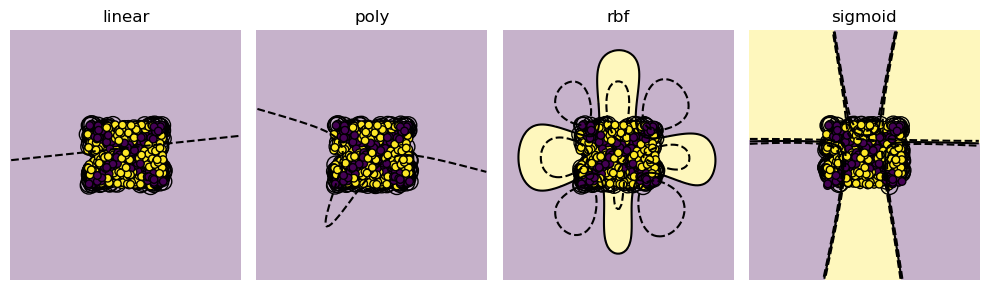

Kernel comparison for pa


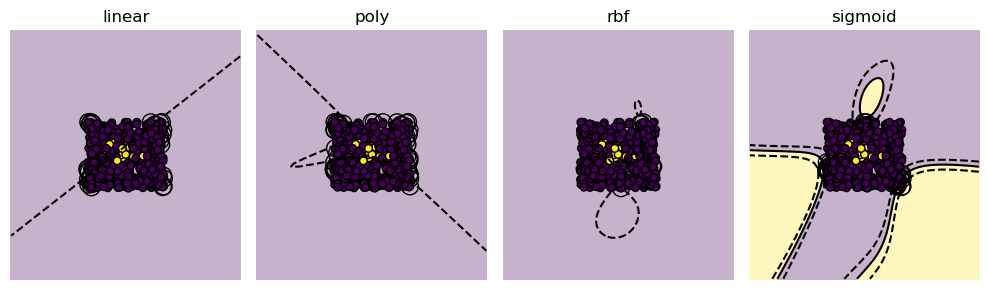

Kernel comparison for ri


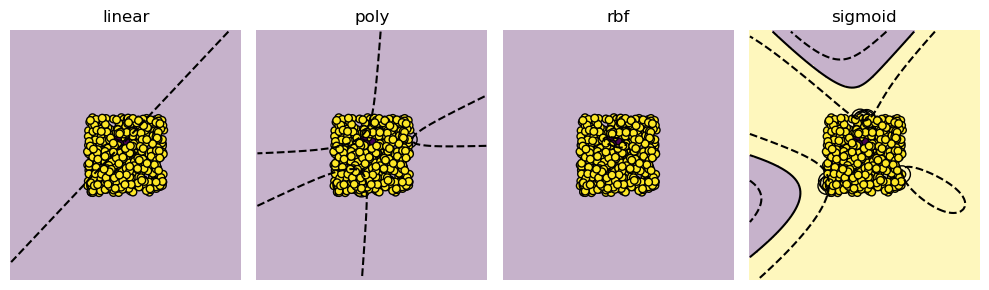

Kernel comparison for tn


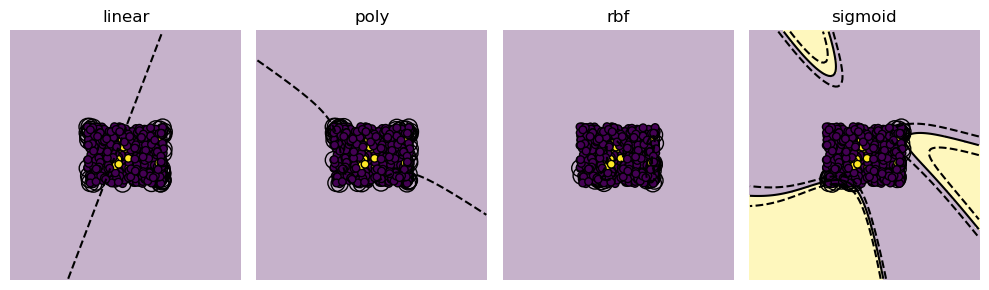

Kernel comparison for nv


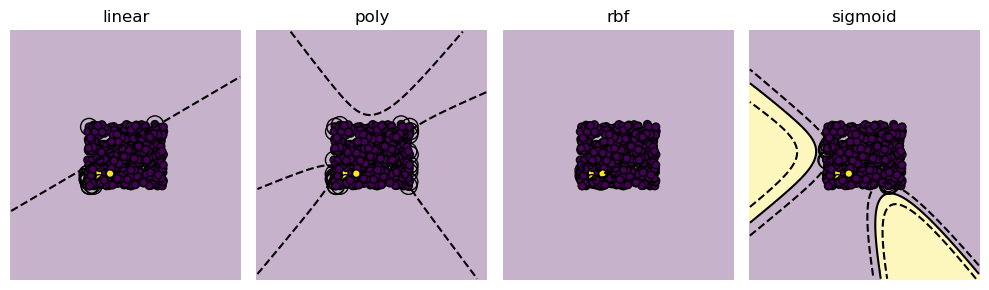

Kernel comparison for or


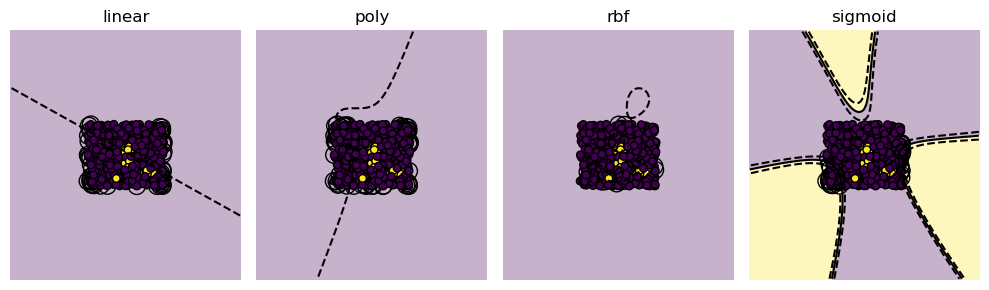

Kernel comparison for tx


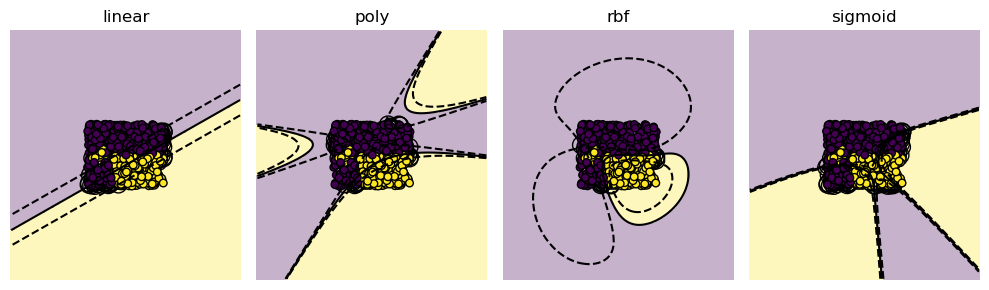

Kernel comparison for wa


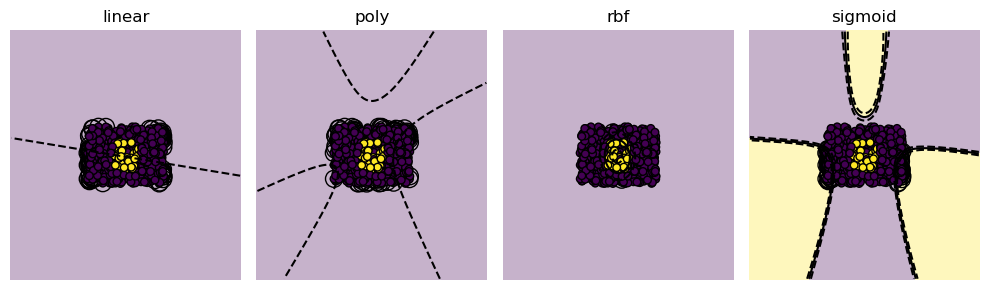

Kernel comparison for wv


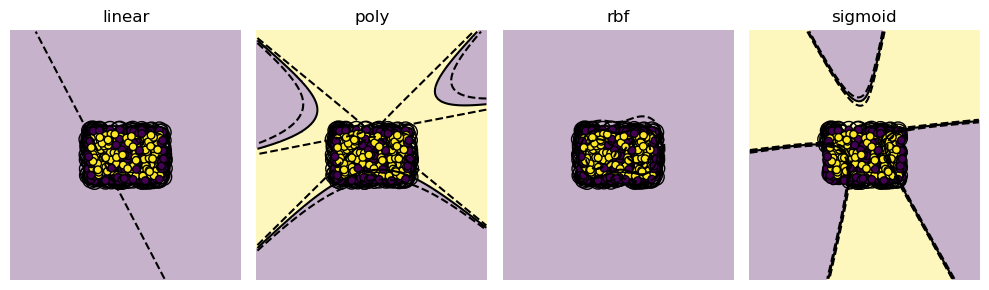

Kernel comparison for nc


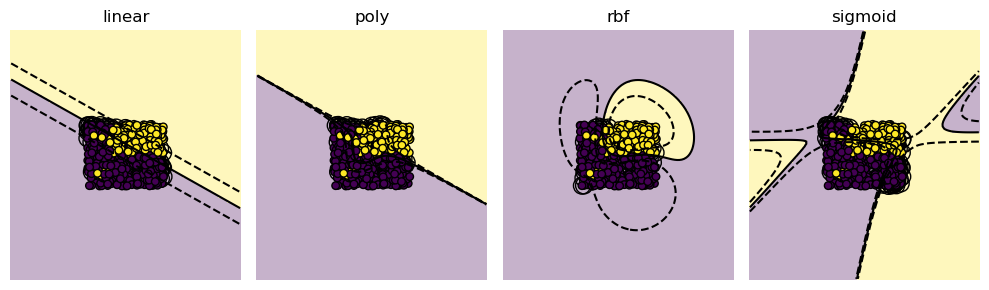

Kernel comparison for mo


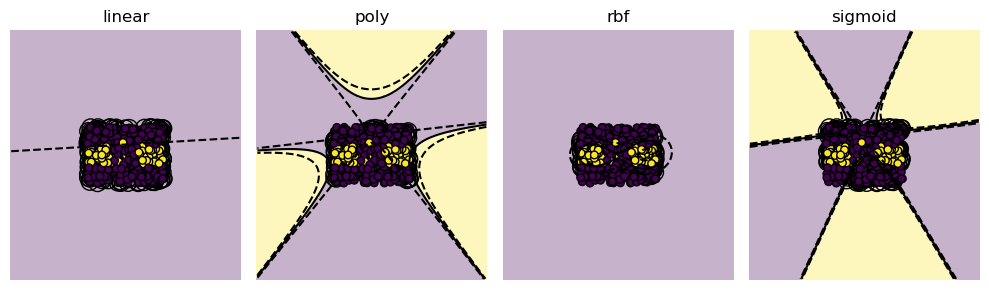

Kernel comparison for al


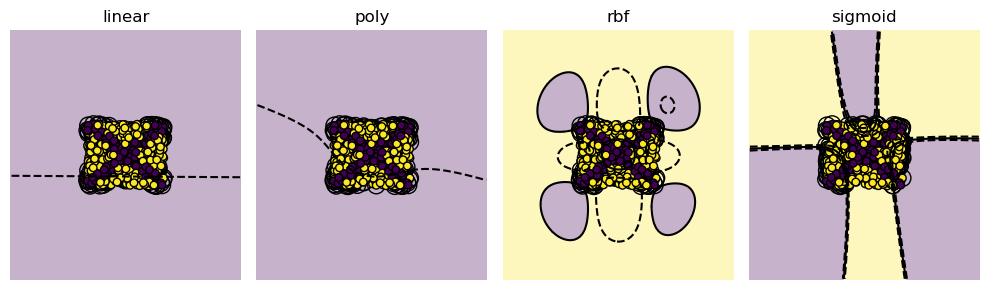

Kernel comparison for az


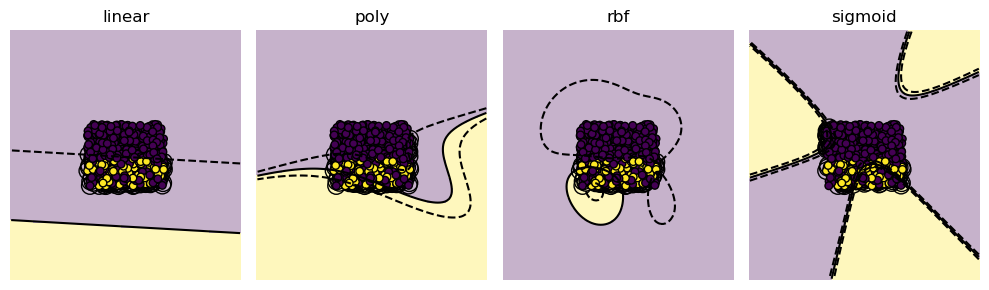

Kernel comparison for mn


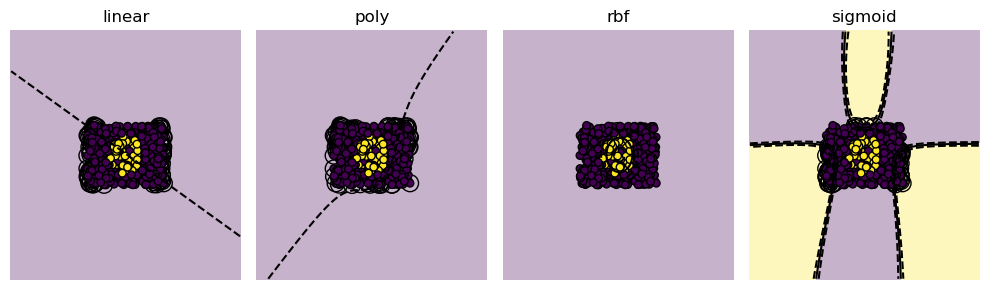

Kernel comparison for ca


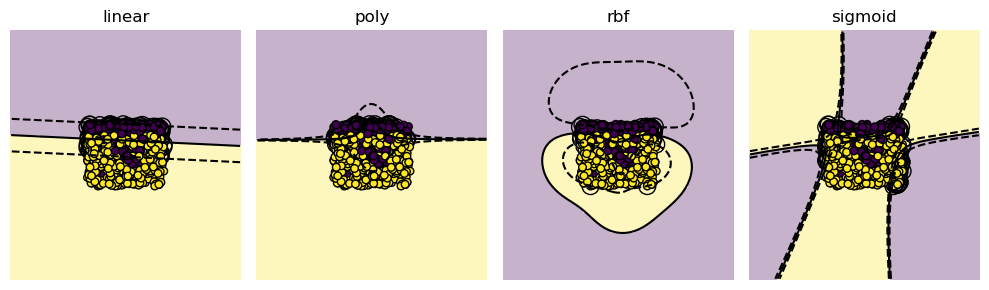

Kernel comparison for va


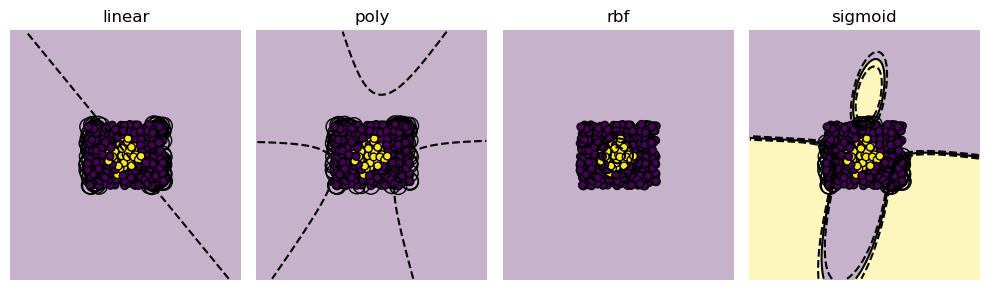

Kernel comparison for vt


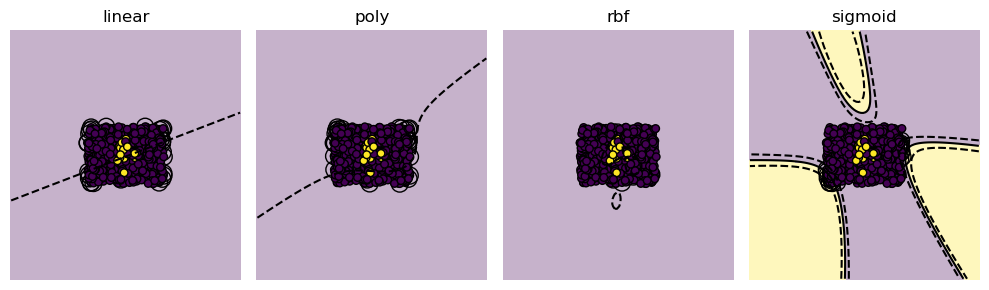

Kernel comparison for mi


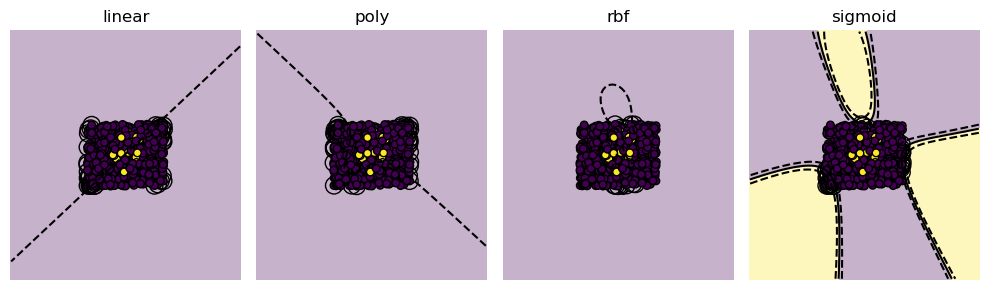

Kernel comparison for ne


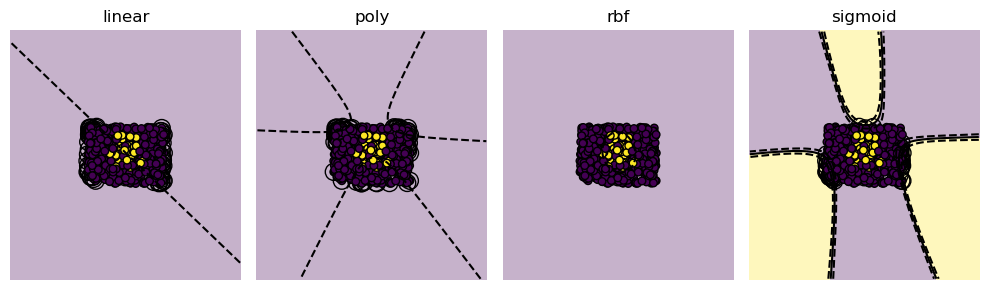

Kernel comparison for ak


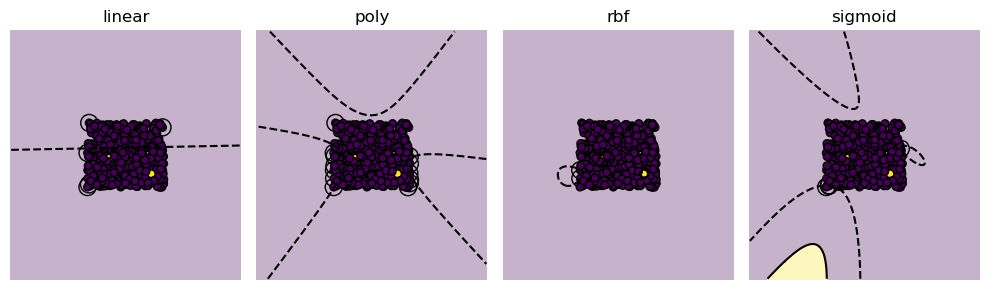

Kernel comparison for ct


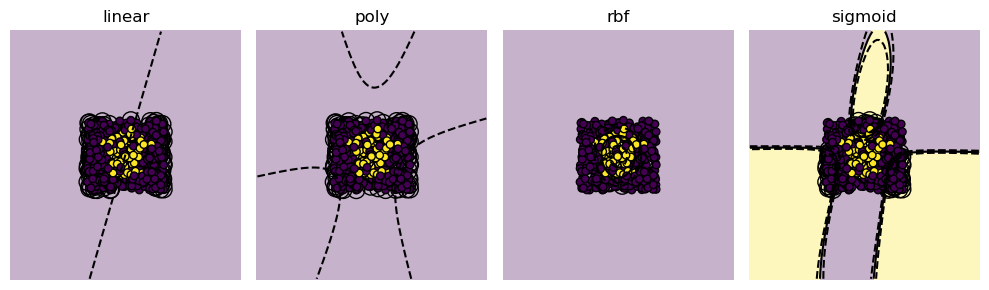

Kernel comparison for nd


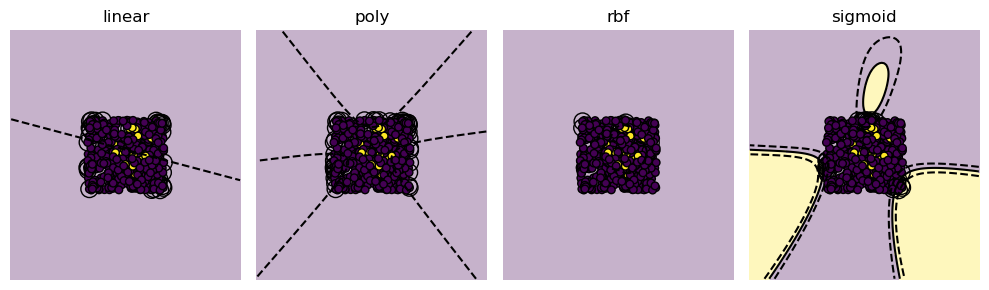

Results for ut: [('linear', 0.9114285714285715, 0.9066666666666666), ('poly', 0.9114285714285715, 0.9066666666666666), ('rbf', 0.9114285714285715, 0.9066666666666666), ('sigmoid', 0.8942857142857142, 0.8933333333333333)]
Results for me: [('linear', 0.9571428571428572, 0.92), ('poly', 0.9571428571428572, 0.92), ('rbf', 0.9571428571428572, 0.92), ('sigmoid', 0.9571428571428572, 0.92)]
Results for la: [('linear', 0.8142857142857143, 0.86), ('poly', 0.8142857142857143, 0.86), ('rbf', 0.8542857142857143, 0.88), ('sigmoid', 0.6971428571428572, 0.7866666666666666)]
Results for co: [('linear', 0.7171428571428572, 0.74), ('poly', 0.7314285714285714, 0.74), ('rbf', 0.8714285714285714, 0.8733333333333333), ('sigmoid', 0.5171428571428571, 0.5933333333333334)]
Results for nh: [('linear', 0.9028571428571428, 0.8733333333333333), ('poly', 0.9028571428571428, 0.8733333333333333), ('rbf', 0.9028571428571428, 0.8733333333333333), ('sigmoid', 0.8771428571428571, 0.86)]
Results for ms: [('linear', 0.86857

In [37]:
#Author: Henry Moore, with help from Divik Verma and Catherine Chu
#Date: July 31, 2024
#Assignment: SVM and Kernels

# standard imports
import os, random
import numpy as np
import matplotlib.pyplot as plt

# sklearn imports
from sklearn.datasets import *
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Image import
from PIL import Image

# Function to convert an array of real numbers into an array of 0s and 1s
def binarize(arr, split=10):
    # Calculate the decile thresholds
    percentiles = int(np.ceil(100/split))
    split_points = np.arange(0, 100+percentiles, percentiles)
    split_points[split_points>100] = 100
    deciles = np.percentile(arr, split_points)
    
    # Create a new array to hold the modified values
    modified_arr = np.zeros_like(arr)
    
    # Iterate through each decile range and set values accordingly
    for i in range(split):
        print(i)
        if i == split-1:
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i])] = 1
        else:        
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 1
    
    return modified_arr

# Function to generate datasets
def generate_dataset(dataset_type, n_samples=300, noise=0.1, split=10, random_state=0):
    if dataset_type == 'linearly_separable':
        X, y = make_classification(n_samples=n_samples, n_features=2, n_redundant=0, n_informative=2,
                                   random_state=random_state, n_clusters_per_class=1)
    elif dataset_type == 'blobs':
        X, y = make_blobs(n_samples=[n_samples//2, n_samples//2], random_state=random_state, cluster_std=noise)
    elif dataset_type == 'quantiles':
        X, y = make_gaussian_quantiles(n_samples=n_samples, n_classes=2, cov=noise, random_state=random_state)
    elif dataset_type == 'moons':
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    elif dataset_type == 'circles':
        X, y = make_circles(n_samples=n_samples, noise=noise, factor=0.5, random_state=random_state)
    elif dataset_type == 'unstructured':
        X, y = np.random.random(size=(n_samples, 2)), np.random.randint(0,2, size=(n_samples))
    elif dataset_type == 'swiss':
        X, y = make_swiss_roll(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    elif dataset_type == 'scurve':
        X, y = make_s_curve(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    else:
        raise ValueError("Invalid dataset type")
    
    X = StandardScaler().fit_transform(X)
    return X, y

#1.1

# Generate and visualize data blobs
X, y = make_blobs(n_samples=300, centers=2, random_state=42)
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Blobs Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

#This group will clearly be easy to classify with a linear classifier; the two groups are very distinct
#I anticipate that this data will be slightly harder to classify with a nonlinear classifier than with a nonlinear classifer
#but it should still be very easy because there are nonlinear classifiers such as polynomial classifers that can perform a linear classification.

# Generate and visualize unstructured data
np.random.seed(0)
X = np.random.random(size=(300, 2))
y = np.random.randint(0, 2, size=(300))

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Unstructured Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

#I think that this data will be nearly impossible to classify, regardless of the linearity of the classifier
#The data follows no pattern, so any predictive model would be futile

# Generate and visualize circles data set
X, y = make_circles(n_samples=300, factor=0.5, noise=0.05, random_state=0)
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Circles Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#I anticipate that this data set would be very difficult for a linear classifier, but not too difficult for a nonlinear classifier
#This is becuase the data points have a very explicit, well-defined boundary, it simply isn't linear

# Generate and visualize Gaussian quantiles
X, y = make_gaussian_quantiles(mean=None, cov=1.0, n_samples=300, n_features=2, n_classes=2, random_state=0)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Gaussian Quantiles Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#Simlarly to the "circles" dataset, it will be very difficult for the linear classifier to classify this because the deicison boundary looks elliptical
#Again like the circles, it will be easier for a nonlinear clasisifer such as a kernel to classify the boundary.

# Generate and visualize linearly separable data
X, y = make_classification(n_samples=300, n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=1, random_state=0)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Linearly Separable Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#I anticipate that this data set will be easy for linear classifiers to produce a deciison boundary as there is a clear line between the two features.
#The nonlinear clasisifer should also be able to accurately classify this dataset becauase it can just produce a linear function.
#However, since the nonlinear classifier will have unnecessary complexity, the linear classifier is still better for efficiency purposes.

# Generate and visualize moons data set
X, y = make_moons(n_samples=300, noise=0.1, random_state=0)  # Added noise for more complexity

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Moons Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#This dataset looks like it would be difficult to classify with a linear classifier, but easy to classify with a nonlinear classifier
#This is because there is a clear decision boundary, but it assumes a parabolic shape.

# Generate and visualize swiss role with 2 split sets

np.random.seed(42)
X, color = make_swiss_roll(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=2)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Swiss Roll Dataset Visualization with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#I anticipate that this dataset will be extremely hard for the linear classifer because of the breaks in the dataset throughout the figure. The graph features complex patterns that cannot be easily captured by linear classifiers.
#This would probably still be hard for a non-linear classifier, but there is a distinct decision boundary that could be approximated with a high degree polynomial 

#Generate and visualize S curve with 2 split sets
X, color = make_s_curve(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=2)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('S curve with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#As weird as it seems, a linear classifier could work. A line centered at the origin with sloope of, say, 1/3 would work quite well for this data
#A nonlinear classifier would still work much better, and could extrapolate to furter points in the S

# Generate and visualize swiss role with 10 split sets
X, color = make_swiss_roll(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T  # Flatten to 2D
y = binarize(color, split=10)  # Binarize with 10 splits based on the color

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', edgecolors='k')
plt.title('Swiss Roll Dataset Visualization with 10 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

# Generate and visualize S curve with 10 split sets
X, color = make_s_curve(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=10)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('S curve with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#I anticipate that this dataset will be near-impossible for a linear classifier because of the complex changes between the two features and the breaks in samples.
#A complex a nonlinear classifer could theoretically handle this but it would still be diffficult.

# Generate and visualize S curve with 10 split sets
X, color = make_s_curve(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=10)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('S curve with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

#Like the 10-split swiss roll, a linear classifier would be useless for a graph of this complexity, but a sufficiently complex nonlinear could get the job done given enough computing power

#1.2

def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=3, gamma=3).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

# Show results of kernel comparison for data sets from part 1
dataset_types = ['linearly_separable', 'blobs', 'quantiles', 'moons', 'circles', 'unstructured', 'swiss', 'scurve']

for d_type in dataset_types:
    print(f"Dataset: {d_type}")
    X, y = generate_dataset(d_type)
    kernel_comparison(X, y)

#To summarize the results of the kernel comparison, RBF is highly effecitve for shapes that are curvy and resemble higher dimensional decision boundaries. 
#Examples of effective boundaries drawn by RBF are the scurve, swiss, moons, and the circles. 
#Linear is effective for a couple of distributions, but is only very accurate for the linearly separable and blod datasets. 
#Sigmoid is accurate for none of then except blobs. Poly is also pretty good for the linear ones and makes some attempt at doing the scurve pretty well.

# Examine effect of degree and gamma keyword
def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=5, gamma=3).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=3, gamma=5).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

#The degree argument affects the poly kernel. It changes the model by changing the degree of the polynomial in the kernel. 
#This affects the model's bias-variance tradeoff by leading to overfitting when there are higher degrees that can produce more complex boundaries and are accurate for training sets but overfit to them so less accurate for test sets.

#As one increases the degree, the decision boundary gets more complex becauase it can accomodate higher dimensinoal curves.

#The gamma argument affects the RBF, poly and sigmoid kernels. It changes the model by defining how far the influence of a single trainig eample reaches.
#This affects the model's bias-variance tradeoff by determining whehther the boundaires are smooth (sharper or more sensitive to the data) or lower (smoother).

#As one increases gamma, the decision boundary becomes more rugged since a single trainig example is more close and then the data distribution boundary is really sensitive with a high gamma value.

#2.1
def load_images(folder):
    images = []
    labels = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img)//(256/2) # Convert to BW
            images.append(img)
            labels.append(filename.split('.')[0])  # Extract the state code as label
    return images, labels

# Display four black-and-white flags in a 2x2 grid
def display_images(images, labels):
    fig, axis = plt.subplots(nrows =2, ncols=2)
    axis = axis.flatten()

    for img, label, axis in zip(images, labels, axis):
        #put it in grayscale
        axis.imshow(img, cmap='gray')
        axis.set_title(label)
        axis.axis('off')
    
    plt.tight_layout()
    plt.show()

folder = '/Users/henrymoore/Desktop/mathai2/flags'
images, labels = load_images(folder)
display_images(images, labels)

#2.2
def sample_pixels(image, num_samples=100):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1/width-0.5, x2/width-0.5])
        pixel_labels.append(image[x2,x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

# Visual kernel comparison for selected flags
images, labels = load_images('/Users/henrymoore/Desktop/mathai2/flags')

# Sample pixels from each image
for img, label in zip(images, labels):
    X, y = sample_pixels(img, num_samples=700)
    print(f"Kernel comparison for {label}")
    kernel_comparison(X, y, if_flag=True)
# Non-visual kernel comparison for all flags
images, labels = load_images('/Users/henrymoore/Desktop/mathai2/flags')

#Quantitative analysis of different kernels on flags
for img, label in zip(images, labels):
    X, y = sample_pixels(img, num_samples=500) 
    print(f"Kernel comparison for {label}")
    kernel_comparison(X, y, if_flag=True)
def run_quantitative_analysis(images, labels, num_samples=500):
    all_results = {}
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']

    for img, label in zip(images, labels):
        X, y = sample_pixels(img, num_samples=num_samples)  # Use the sample_pixels function
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)  # Split the data
        kernel_results = []

        for kernel in kernels:
            clf = svm.SVC(kernel=kernel, degree=3, gamma=5)  # Use fixed degree and gamma
            clf.fit(X_train, y_train)  # Train the classifier
            train_accuracy = clf.score(X_train, y_train)  # Calculate train accuracy
            test_accuracy = clf.score(X_test, y_test)  # Calculate test accuracy
            kernel_results.append((kernel, train_accuracy, test_accuracy))  # Append results

        all_results[label] = kernel_results
        print(f"Results for {label}: {kernel_results}")  # Print results for each flag

    return all_results

all_results = run_quantitative_analysis(images, labels)

def sample_pixels(image, num_samples=100):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1 / width - 0.5, x2 / height - 0.5])
        pixel_labels.append(image[x2, x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

def analyze_flags_performance(images, labels, num_samples=500):
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']
    results = {kernel: [] for kernel in kernels}

    for img, label in zip(images, labels):
        X, y = sample_pixels(img, num_samples=num_samples)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        for kernel in kernels:
            clf = svm.SVC(kernel=kernel, degree=5, gamma=5)
            clf.fit(X_train, y_train)
            accuracy = accuracy_score(y_test, clf.predict(X_test))
            results[kernel].append((label, accuracy))

    #sort results
    sorted_results = {kernel: sorted(data, key=lambda x: x[1], reverse=True) for kernel, data in results.items()}

    #loop for top 3 in each
    for kernel, data in sorted_results.items():
        top_three = [state for state, _ in data[:3]]
        bottom_three = [state for state, _ in data[-3:]]
        print(f"{kernel.capitalize()} kernel performed best on the flags of the following three states:")
        print(top_three)
        print("It performed worst on the flags of the following three states:")
        print(bottom_three)
        print("\n")

analyze_flags_performance(images, labels)

#For these experiments, I set num_samples to 700 because the results of the experiments seem to be the most stable for this number of sampled pixels.

#The linear kernel performed best (i.e., highest test accuracy) on the flags of the following three states: Alaska, rhode island, nevada
#It performed worst on the flags of the following three states: alabama, iowa, maryland

#The polynomial kernel performed best on the flags of the following three states: alaska, rhode island, nevada
#It performed worst on the flags of the following three states: alabama, iowa, maryland

#The radial-basis function kernel performed best on the flags of the following three states: Alaska, rhode island, nevada 
#It performed worst on the flags of the following three states: hawaii, alabama, maryland

#The sigmoid kernel performed best on the flags of the following three states: alaska, rhode island, nevada 
#It performed worst on the flags of the following three states: maryland, alabama, florida

#2.3

#only do certain images
def load_images(folder, selected_flags):
    images = []
    labels = []
    for filename in os.listdir(folder):
        base_name = filename.split('.')[0]
        if base_name in selected_flags and filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img) // 128  # Convert to binary image (0 or 1)
            images.append(img)
            labels.append(base_name)
    return images, labels

def sample_pixels(image, num_samples=500):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x = random.randint(0, width - 1)
        y = random.randint(0, height - 1)
        pixel_data.append([x / width, y / height])  # Normalized pixel positions
        pixel_labels.append(image[y, x])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

def compare_classifiers(images, labels):
    results = {}
    for img, label in zip(images, labels):
        X, y = sample_pixels(img)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Decision Tree
        tree = DecisionTreeClassifier()
        tree.fit(X_train, y_train)
        tree_acc = tree.score(X_test, y_test)

        # SVM
        svc = svm.SVC(kernel='rbf', gamma='scale')
        svc.fit(X_train, y_train)
        svc_acc = svc.score(X_test, y_test)

        results[label] = {'Decision Tree Accuracy': tree_acc, 'SVM Accuracy': svc_acc}
    
    return results

# Select flags and folder path
selected_flags = ["ca", "tx", "nm", "co"]
folder_path = '/Users/henrymoore/Desktop/mathai2/flags'
images, labels = load_images(folder_path, selected_flags)
results = compare_classifiers(images, labels)

# Print results
print(results)

#Colorado, new mexico, and texas beat the SVM accuracy from the decision accuracy as printed above. 
#I thought california was pretty simple but the SVM was still better than the simple decision tree.
